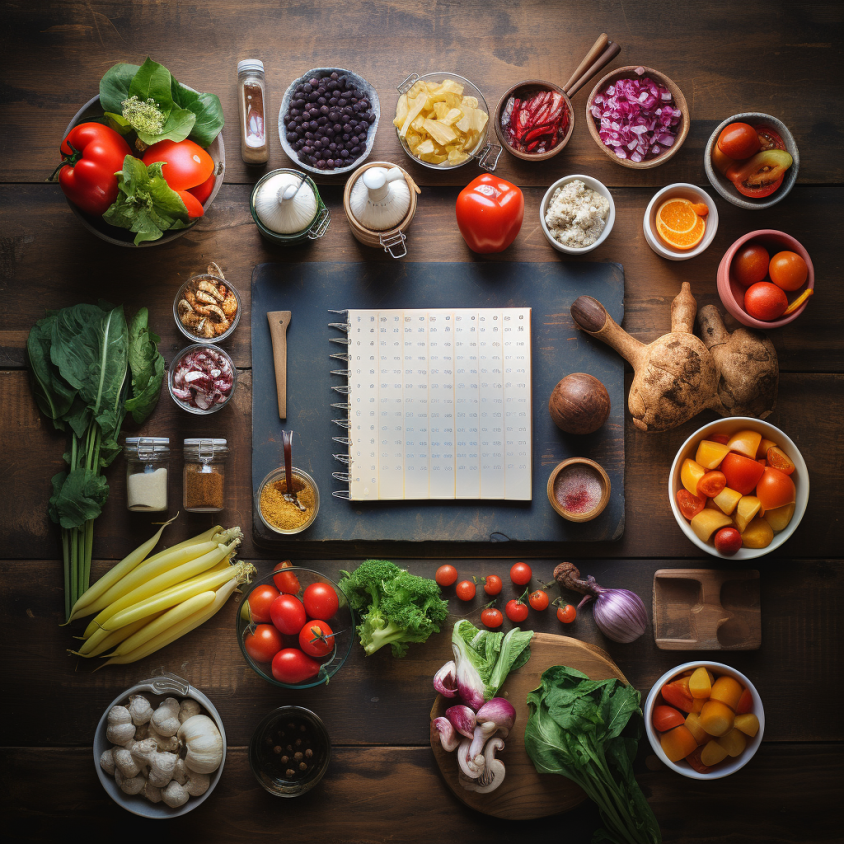

In [144]:
# Import healthy2.png image
from IPython.display import Image
Image(filename='recipe2.png')



<H1 size =10><center>Data Science Professional 2023 </center></H1>
<HR></HR>
<H2  color='#1A846B' size =7><center> Predictive Recipes Traffic Webste</center></H2>

# <a id='toc1_'></a>[Report Summary](#toc0_)

Your written report should include both code, output and written text summaries of the following:

Data Validation:
Describe validation and cleaning steps for every column in the data
Exploratory Analysis:
Include two different graphics showing single variables only to demonstrate the characteristics of data
Include at least one graphic showing two or more variables to represent the relationship between features
Describe your findings
Model Development
Include your reasons for selecting the models you use as well as a statement of the problem type
Code to fit the baseline and comparison models
Model Evaluation
Describe the performance of the two models based on an appropriate metric
Business Metrics
Define a way to compare your model performance to the business
Describe how your models perform using this approach
Final summary including recommendations that the business should undertak

## <a id='toc1_1_'></a>[Data Validation](#toc0_) 📊

#### 1. **Recipe Identification** 📖
- Unique Identifiers: `947` 
- Status: No missing values, no cleaning required.

#### 2. **Categories** 📁
- Unique Values: `11` (Previously `10`)
- Modification: 'Chicken Breast' revised to 'Chicken', one hot encoded subsequently.

#### 3. **Servings** 🍲
- Unique Values: `6` 
- Modification: Transformed character to integer, refined descriptions.

#### 4. **Traffic Analysis** 🚦
- Missing Values: `373` (Not at random)
- Modification: Replaced `NA` and `NaN` with 'Low', encoded as `1` (High) and `0` (Not High).

#### 5. **Nutritional Information** 🍎
- Missing Values: `52` in Calories, Carbohydrate, Sugar, Protein.
- All numerical features exhibit positive skewness, indicating right-skewed distributions. This aligns with our observations from the histograms.
- All features have kurtosis values significantly greater than 0, indicating that their distributions have heavier tails compared to a normal distribution. This suggests the presence of potential outliers.
- Strategy: Grouped by category & servings, utilized mean values, and applied Power Transformer for normal distribution.
  - **Calories**: 
    - Non-null Values: `895`
    - Modification: Capped extreme outliers, scaled using MinMax.
  - **Carbohydrate**: 
    - Non-null Values: `895`
    - Modification: Capped extreme outliers, scaled using MinMax.
  - **Sugar**: 
    - Non-null Values: `895`
    - Modification: Capped extreme outliers, scaled using MinMax.
  - **Protein**: 
    - Non-null Values: `895`
    - Modification: Capped extreme outliers, scaled using MinMax.



## 📉 Exploratory Analysis Summary

#### 1. **Distribution Analysis 📈**
   - Histograms for **Calories**, **Carbohydrates**, **Sugar**, and **Protein** unveil leftward skewness with a presence of outliers, slated for rectification in future analyses.

#### 2. **Recipe Category Distribution 🥧**
   - A substantial number of recipes fall under **Beverages**, **Breakfast**, and **Potato** categories, whereas **Pork** category is underrepresented, suggesting a potential area for content diversification.

#### 3. **Traffic Analysis by Category 🚦**
   - Categories like **Vegetables**, **Potatoes**, and **Pork** garner substantial traffic, contrasting with lower traffic for **Breakfast** and **Beverages** despite their higher recipe counts. The Chi-Squared statistic underscores a significant association between recipe category and traffic levels.

#### 4. **Nutritional Variables vs Traffic Analysis 🍔**
   - Bix plot and T-tests reveal:
     - Significant differences in **Calories** and **Sugar** at 5% level between high and low traffic groups.
     - No discernible difference in **Carbohydrates**.
     - Pronounced difference in **Protein**.

#### 5. **Category-Traffic Correlation 🔄**
   - Noteworthy correlations with traffic are observed for:
     - **category_Beverages**: -0.38
     - **category_Vegetable**: 0.24
     - **category_Potato**: 0.22
     - **category_Breakfast**: -0.21
   - Traffic dips for **Beverages** and **Breakfast** categories, while it elevates for **Vegetables** and **Potatoes**, presenting actionable insights for content optimization.

---

These summarized insights provide a substantial understanding of the data, forming a foundation for subsequent in-depth analyses and strategic decision-making.



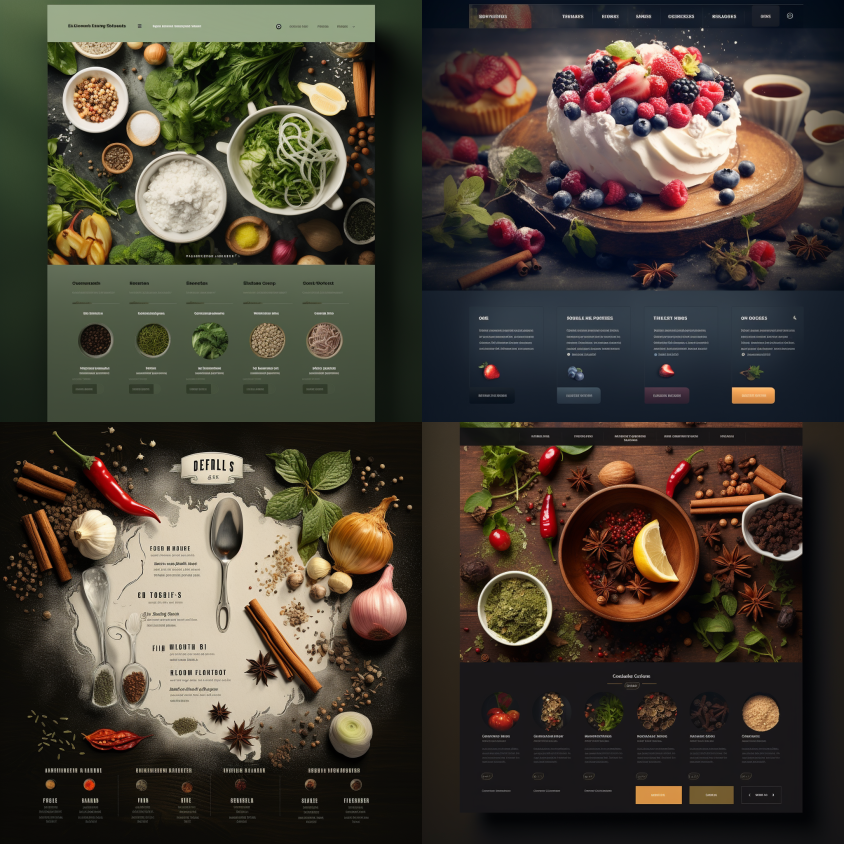

In [145]:
# Import healthy2.png image
from IPython.display import Image
Image(filename='website3.png')

# Notebook

# <a id='toc2_'></a>[Import Libaries](#toc0_)

In [146]:
# Import libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats
from sklearn.preprocessing import PowerTransformer
from scipy.stats import shapiro
from scipy.stats import ttest_ind
from scipy.stats import chi2_contingency
from sklearn.linear_model import LogisticRegression
from sklearn.feature_selection import RFE
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score, precision_score, recall_score, accuracy_score
from sklearn.model_selection import cross_val_score
from sklearn.metrics import make_scorer
from sklearn.metrics import classification_report
from sklearn.svm import LinearSVC
from sklearn.naive_bayes import BernoulliNB
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.linear_model import SGDClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, recall_score, f1_score
from sklearn.ensemble import GradientBoostingClassifier
from xgboost import XGBClassifier

from sklearn.ensemble import VotingClassifier

import warnings
warnings.filterwarnings("ignore", message="size changed, may indicate binary incompatibility. Expected 56 from C header, got 64 from PyObject")



# <a id='toc3_'></a>[Data Validation and Cleansing](#toc0_)

## Data Checks

In [147]:
df = pd.read_csv("recipe_site_traffic_2212.csv")
df

,recipe,calories,carbohydrate,sugar,protein,category,servings,high_traffic
0,1,NaN,NaN,NaN,NaN,Pork,6,High
1,2,35.48,38.56,0.66,0.92,Potato,4,High
2,3,914.28,42.68,3.09,2.88,Breakfast,1,NaN
3,4,97.03,30.56,38.63,0.02,Beverages,4,High
4,5,27.05,1.85,0.80,0.53,Beverages,4,NaN
...,...,...,...,...,...,...,...,...
942,943,1161.00,5.31,22.39,44.22,Lunch/Snacks,2,NaN
943,944,NaN,NaN,NaN,NaN,Potato,2,High
944,945,951.74,29.42,3.57,13.87,Pork,2,High
945,946,266.61,35.77,0.97,8.07,Potato,6,High


In [148]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 947 entries, 0 to 946
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   recipe        947 non-null    int64  
 1   calories      895 non-null    float64
 2   carbohydrate  895 non-null    float64
 3   sugar         895 non-null    float64
 4   protein       895 non-null    float64
 5   category      947 non-null    object 
 6   servings      947 non-null    object 
 7   high_traffic  574 non-null    object 
dtypes: float64(4), int64(1), object(3)
memory usage: 59.3+ KB


In [149]:
# Set index as recipe
df = df.set_index('recipe')

In [150]:
# get statistical summary
df.describe()

,calories,carbohydrate,sugar,protein
count,895.000000,895.000000,895.000000,895.000000
mean,435.939196,35.069676,9.046547,24.149296
std,453.020997,43.949032,14.679176,36.369739
min,0.140000,0.030000,0.010000,0.000000
25%,110.430000,8.375000,1.690000,3.195000
50%,288.550000,21.480000,4.550000,10.800000
75%,597.650000,44.965000,9.800000,30.200000
max,3633.160000,530.420000,148.750000,363.360000


In [151]:
# Check for missing values and data types
missing_values = df.isnull().sum()
data_types = df.dtypes

missing_values, data_types

(calories         52
 carbohydrate     52
 sugar            52
 protein          52
 category          0
 servings          0
 high_traffic    373
 dtype: int64,
 calories        float64
 carbohydrate    float64
 sugar           float64
 protein         float64
 category         object
 servings         object
 high_traffic     object
 dtype: object)

| Missing Values | Columns                                                |
|-------------|---------------------------------------------------------|
| 52   | </br> calories, carbohydrate, sugar, and protein columns. |
| 373        |  </br>high_traffic  |

<div class="alert alert-success" role="alert">
  <h4 class="alert-heading">Data Types Analysis:</h4>
  
  <ul>
    <li><strong>Nutritional Information:</strong>
      <ul>
        <li><code>calories</code>, <code>carbohydrate</code>, <code>sugar</code>, and <code>protein</code> columns are of type <code>float</code>, which is suitable for representing nutritional values.</li>
      </ul>
    </li>
    <li><strong>Categorical Data:</strong>
      <ul>
        <li>The <code>category</code> and <code>high_traffic</code> columns are of type <code>object</code> (likely strings), aligning with the categorical nature of these columns.</li>
      </ul>
    </li>
    <li><strong>Serving Information:</strong>
      <ul>
        <li>The <code>servings</code> column is of type <code>object</code>, which could pose a <em>concern</em> as a numerical data type might be more appropriate for representing serving sizes.</li>
      </ul>
    </li>
  </ul>
  
</div>


In [152]:
# Check the number of rows in the dataset
total_rows = len(df)

# Calculate the proportion of missing values for affected columns
missing_proportions = missing_values / total_rows

total_rows, missing_proportions[['calories', 'carbohydrate', 'sugar', 'protein', 'high_traffic']]


(947,
 calories        0.054910
 carbohydrate    0.054910
 sugar           0.054910
 protein         0.054910
 high_traffic    0.393875
 dtype: float64)

<div class="alert alert-success" role="alert">
  <h4 class="alert-heading">Dataset Size and Missing Values Analysis:</h4>
  
  <p>
    Understanding the size of the dataset and the proportion of missing values is crucial for data analysis. 
  </p>
  
  <ul>
    <li><strong>High Traffic Data:</strong>
      <ul>
        <li>A significant portion, 40%, of the <code>high_traffic</code> column data is missing.</li>
        <li>It's proposed to replace the <code>NaN</code> values with 'Low' to indicate non-high traffic scenarios.</li>
      </ul>
    </li>
    <li><strong>Missing Values Imputation:</strong>
      <ul>
        <li>Approximately 5.49% of data is missing in some columns, considering the option of imputation using statistical measures like median or mean.</li>
        <li>However, imputation trials showed a decline in model performance, leading to the decision of discarding this option and dropping the affected entries instead.</li>
      </ul>
    </li>
  </ul>
  
</div>


##  Data Distribution

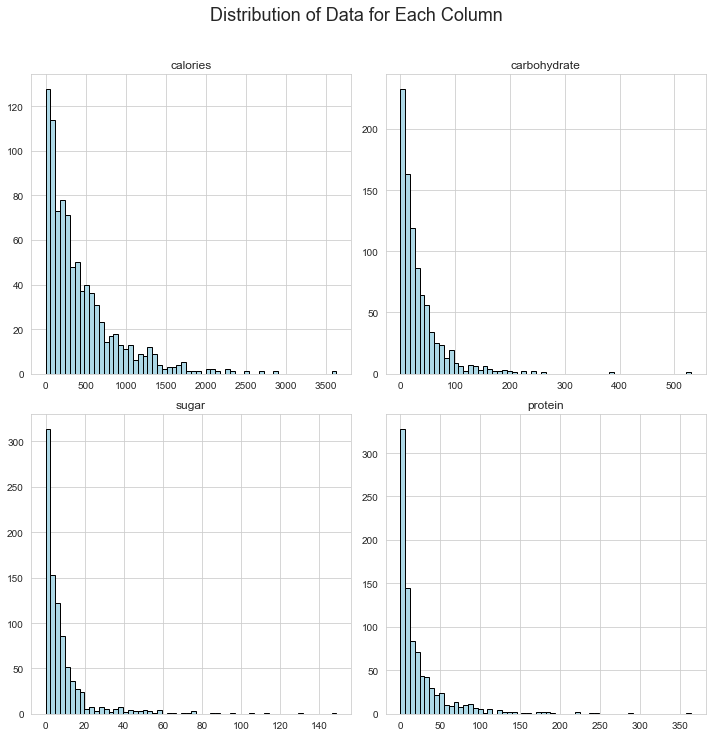

In [153]:
# Set the style for a more aesthetic plot
sns.set_style("whitegrid")

# Plot histograms for all columns
df.hist(figsize=(10, 10), bins=60, color='lightblue', edgecolor='black')
plt.suptitle("Distribution of Data for Each Column", y=1.02, fontsize=18)
plt.tight_layout()
plt.show()


In [154]:
# Calculate skewness and kurtosis for each feature in the dataset
skewness = df.skew()
kurtosis = df.kurtosis()

# Combine the skewness and kurtosis data for easy visualization
skew_kurt_df = pd.DataFrame({'Skewness': skewness, 'Kurtosis': kurtosis})

skew_kurt_df

/var/folders/ks/5bc1x9p158vgc4774v7r2tq40000gn/T/ipykernel_42011/1113275944.py:2: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  skewness = df.skew()
/var/folders/ks/5bc1x9p158vgc4774v7r2tq40000gn/T/ipykernel_42011/1113275944.py:3: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  kurtosis = df.kurtosis()


,Skewness,Kurtosis
calories,2.036151,6.085271
carbohydrate,3.756980,25.609276
sugar,4.223352,24.370963
protein,3.509453,18.197453


Description of Findings:

> **Histogram for _Calories_**:<br>
> - The majority of recipes possess caloric values within a range of approximately 0 to 1000 calories.
> - A right-skewed distribution is observed, indicating a few recipes with significantly higher caloric content extending the distribution towards the right.
> - A prominent peak around the 100-150 calorie range suggests a substantial number of recipes fall within this caloric bracket.

> **Histogram for _Carbohydrates_**:<br>
> - Most recipes have carbohydrate content ranging from 0 to 50, with a few exceptions extending beyond this range.
> - Similar to calories, a right-skewed distribution is noted, representing a small number of recipes with substantially higher carbohydrate content.

> **Histogram for _Sugar_**:<br>
> - Predominantly, recipes exhibit sugar content below 20, with few exceptions.
> - The distribution again is right-skewed, highlighting a small number of recipes with significantly higher sugar content.

> **Histogram for _Protein_**:<br>
> - Protein content largely falls below 50, with a dense clustering observed in the 0 to 10 range.
> - A right-skewed distribution indicates a few recipes with much higher protein content.

> **Skewness**:
> - Positive skewness is observed across all numerical features, aligning with the right-skewed distributions noticed in the histograms.

> **Kurtosis**:
> - All features exhibit kurtosis values significantly above 0, implying heavier tails in their distributions compared to a normal distribution, which hints at the potential presence of outliers.


Before moving on to modeling, let's visualize the distribution of recipes across different categories. This will give us an understanding of the popularity of each category.

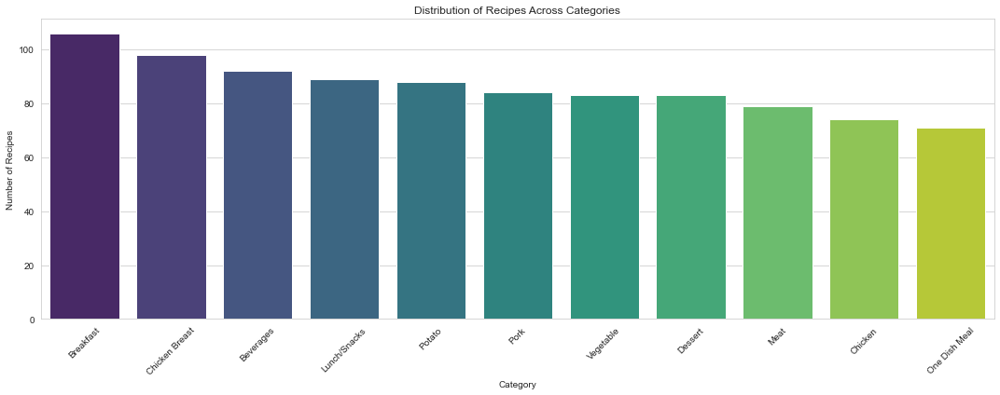

In [155]:
# Plotting the distribution of recipes across different categories
plt.figure(figsize=(15, 6))
sns.countplot(data=df, x='category', order=df['category'].value_counts().index, palette="viridis")
plt.title("Distribution of Recipes Across Categories")
plt.xlabel("Category")
plt.ylabel("Number of Recipes")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

The bar chart provides insights into the distribution of recipes across different categories:

Categories such as "Beverages", "Breakfast", and "Potato" have a higher number of recipes compared to others.
On the other hand, categories like "Pork" have fewer recipes.
This distribution can provide insights into the type of recipes that are more prevalent on the site and which categories might need more content to diversify the offering

## Data Preparation 

Let's eximine the data and unique values 

In [156]:
# Check unique values in 'category', 'servings', and 'high_traffic' columns
category_unique_values = df['category'].unique()
servings_unique_values = df['servings'].unique()
high_traffic_unique_values = df['high_traffic'].unique()

category_unique_values, servings_unique_values, high_traffic_unique_values


(array(['Pork', 'Potato', 'Breakfast', 'Beverages', 'One Dish Meal',
        'Chicken Breast', 'Lunch/Snacks', 'Chicken', 'Vegetable', 'Meat',
        'Dessert'], dtype=object),
 array(['6', '4', '1', '2', '4 as a snack', '6 as a snack'], dtype=object),
 array(['High', nan], dtype=object))

**Category Analysis** 📁
- Consistency Check:
    - The values appear to be consistent with no evident spelling errors.
    - Suggestion: Consider merging similar categories like 'Chicken Breast' and 'Chicken' for better categorization.

**Servings Analysis** 🍲
- Current State:
    - Entries like '4 as a snack' and '6 as a snack' include additional text, which likely results in the column being of type 'object'.
- Recommendations:
    - Clean these entries to extract the numerical part, converting the entire column to a numerical type for better analysis and processing.

**High Traffic Analysis** 🚦
- Current State:
    - The values are either 'High' or NaN (missing), indicating a binary categorization.
- Recommendations:
    - To better represent traffic data, consider replacing NaN values with 'Low' or another suitable value indicating non-high traffic conditions.




In [157]:
# Chicken and Chicken Breast can be put together, replace Chicken Breast with Chicken
df['category'].replace('Chicken Breast', 'Chicken', inplace=True)

In [158]:
# Extract numerical values from the 'servings' column and convert to integer
df['servings'] = df['servings'].str.extract('(\d+)').astype(int)

# Check the unique values in 'servings' after cleaning
servings_unique_values_cleaned = df['servings'].unique()
servings_unique_values_cleaned


array([6, 4, 1, 2])

In [159]:
#replace NaN in high Traffic with Low
df['high_traffic'].fillna('Low', inplace=True)

The code categorizes items in the DataFrame as healthy or not based on their category and nutritional values, and then adds a new column to the DataFrame to store this binary classification.

## New Features 

### Healthiness Feature 🍏

To determine the healthiness of food items in our dataset, we've employed specific criteria grounded in international health guidelines and considerations. Here's the rationale for each criterion:

1. **Vegetable Category 🥦**: The World Health Organization (WHO) underscores the significance of fruits and vegetables for maintaining a balanced diet. It advises the consumption of a minimum of 400g (equivalent to five portions) of fruits and vegetables daily for adults, excluding starchy roots such as potatoes and sweet potatoes​¹​. Given the nutritional benefits of vegetables, any food item labeled 'Vegetable' is immediately classified as healthy.

2. **Calorie Threshold (<= 400) 🔥**: The WHO highlights the importance of ensuring a balance between energy intake and energy expenditure to prevent unwanted weight gain. While the WHO doesn't prescribe a specific caloric limit, the 400-calorie threshold in the code may be based on other guidelines or health considerations​​.

3. **Carbohydrate Content (>= 15 and <= 80) 🍞**: Although the WHO has revised its stance on carbohydrate consumption, emphasizing total fat, saturated, and trans-fat intakes​²​, it hasn't provided a precise range for healthy carbohydrate intake. Meanwhile, the United States Department of Agriculture (USDA) recommends that adults derive 45% to 65% of their daily calories from carbohydrates. This guideline may have influenced the carbohydrate thresholds set in the code​​.

4. **Sugar Content (<= 10) 🍭**: The WHO suggests limiting free sugar intake to less than 10% of total daily energy. This is roughly equivalent to 50g (or around 12 level teaspoons) of sugar for someone ingesting about 2000 calories daily. Even further, decreasing this limit to under 5% of total daily intake is proposed for augmented health benefits​​.

5. **Protein Content (>= 30) 🥩**: The USDA advises adults to get between 10% and 35% of their daily calories from protein​. For an individual on a 2000-calorie diet, this would equate to between 50 and 175 grams of protein daily. The code's 30-gram protein threshold might be set to reflect the minimum protein intake for a particular food item to be deemed healthy.

In [160]:
# provide mean and median for calories, carbohydrate, sugar, and protein in pivot
df.pivot_table(index='category', values=['calories', 'carbohydrate', 'sugar', 'protein'], aggfunc=['mean', 'median'])




mean                                      median  \
                 calories carbohydrate    protein      sugar calories   
category                                                                
Beverages      177.732174    15.955978   0.594783  12.537283  126.455   
Breakfast      331.880000    39.711698  16.957170   7.552264  229.380   
Chicken        551.511227    25.608344  47.793865   5.344049  379.160   
Dessert        351.402078    55.661818   5.759870  35.228442  288.550   
Lunch/Snacks   478.848537    42.820976  19.610976   5.309146  369.505   
Meat           584.533784    22.159595  40.377027   5.813649  460.870   
One Dish Meal  579.090000    50.383433  35.926418   6.011642  419.280   
Pork           629.708082    28.076164  43.797671   8.040137  399.260   
Potato         425.068554    58.150361   8.574217   3.718916  269.460   
Vegetable      245.014872    23.679359   7.891923   5.065128  124.305   

                                            
              carbohydrate protein   sugar  
category                                    
Beverages           11.250   0.410   8.075  
Breakfast           28.420  11.685   4.830  
Chicken             15.490  33.170   3.500  
Dessert             38.550   4.810  24.650  
Lunch/Snacks        31.985  12.965   2.750  
Meat                19.115  28.530   3.385  
One Dish Meal       25.430  28.480   4.040  
Pork                19.560  29.820   5.230  
Potato              32.540   5.900   2.640  
Vegetable           13.335   4.835   3.700

In [161]:
def determine_healthiness(row):
    if row['category'] == 'Vegetable':
        return 1
    elif (row['calories'] <= 400 and 
          row['carbohydrate'] <= 80 and 
          row['sugar'] <= 10 and 
          row['protein'] >= 25):
        return 1
    else:
        return 0

# Apply the function to each row of the dataframe
df['healthy'] = df.apply(determine_healthiness, axis=1)

In [162]:
df['category'].unique()


array(['Pork', 'Potato', 'Breakfast', 'Beverages', 'One Dish Meal',
       'Chicken', 'Lunch/Snacks', 'Vegetable', 'Meat', 'Dessert'],
      dtype=object)

In [163]:
# percentage healthy of total rows
df[df['healthy']==1].value_counts(['high_traffic'])/len(df)

high_traffic
High            0.137276
Low             0.041183
dtype: float64

In [164]:
# count healthy 
df[df['healthy']==1].value_counts(['high_traffic'])

high_traffic
High            130
Low              39
dtype: int64

### Difficulty Feature 🍴🔍

The `difficulty` variable aims to quantify the complexity of preparing a particular recipe, based on two primary factors: the recipe's category and the number of servings. Here's a deeper dive into the reasoning:

1. **Category-based Difficulty Points 🍛**:
    - Every recipe category inherently comes with its own set of challenges. For example, making a dessert might generally be more intricate than whipping up a beverage. 
    - The `category_points` dictionary assigns a base difficulty score to each category. These scores range from 1 to 4, where 1 indicates a relatively simple preparation process (e.g., 'Beverages' and 'Breakfast') and 4 signifies more complex recipes (e.g., 'Dessert', 'Meat', and 'Pork').
    
2. **Servings as a Proxy for Complexity 🥘**:
    - Intuitively, the number of servings can influence the preparation complexity. Cooking for more people might involve more ingredients, larger equipment, or more meticulous planning. 
    - In the current setup, the `difficulty` score increases linearly with the number of servings. This means a recipe intended for 5 people will have a difficulty score 5 points higher than the same recipe meant for a single person.
    
3. **Resulting Difficulty Score 📊**:
    - The final `difficulty` score for each recipe is the sum of its category-based score and its servings. 
    - This approach provides a holistic view of the recipe's complexity, combining both the inherent challenges of its category and the logistics of preparing it for multiple people.
    
4. **Analysis 📈**:
    - After calculating the `difficulty` score for each recipe, the code groups the data by difficulty and counts the number of recipes in each difficulty level that are associated with high traffic. This could provide insights into which difficulty levels are most popular or draw the most attention.

In summary, the `difficulty` variable offers a synthesized metric representing the intricacy of a recipe, considering both its category and intended audience size. As with any scoring system, while it encapsulates certain key factors, it may require refinements based on feedback, user behavior, or additional considerations.

---

In [165]:
#Difficulty 

category_points = {'Beverages': 1, 'Breakfast': 1, 'Chicken': 3, 'Dessert': 4,
                   'Lunch/Snacks': 3, 'Meat': 4, 'One Dish Meal': 3, 'Pork': 4, 'Potato': 1, 'Vegetable': 1}

# Create a dictionary to map servings to difficulty points

# Create a new column "difficulty" by mapping the category and servings to their corresponding points
df['difficulty'] = df['category'].map(category_points) + df['servings']
df[['difficulty','high_traffic']].groupby('difficulty').value_counts()

difficulty  high_traffic
2           Low              39
            High             29
3           High             39
            Low              30
4           High             43
            Low              23
5           High            153
            Low             112
6           High             33
            Low              13
7           High            111
            Low              97
8           High             83
            Low              20
9           High             41
            Low              25
10          High             42
            Low              14
dtype: int64

In [166]:
high_traffic_df = df[df['high_traffic'] == 'High']
low_traffic_df = df[df['high_traffic'] == 'Low']


t, p = ttest_ind(high_traffic_df['difficulty'], low_traffic_df['difficulty'])
print("t-statistic for difficulty: ", t)
print("p-value for difficulty: ", p,'\n')

t-statistic for difficulty:  3.7566960679931305
p-value for difficulty:  0.00018271137797831383 



In [167]:
def rank_difficulty(value):
    if 2 <= value <= 4:
        return 1  # Easy
    elif 5 <= value <= 7:
        return 2  # Medium
    elif 8 <= value <= 10:
        return 3  # Hard
    else:
        return None  # For values outside the range or missing data

df['difficulty'] = df['difficulty'].apply(rank_difficulty)


In [168]:
df[['difficulty','high_traffic']].groupby('difficulty').value_counts()


difficulty  high_traffic
1           High            111
            Low              92
2           High            297
            Low             222
3           High            166
            Low              59
dtype: int64

In [169]:
high_traffic_df = df[df['high_traffic'] == 'High']
low_traffic_df = df[df['high_traffic'] == 'Low']


t, p = ttest_ind(high_traffic_df['difficulty'], low_traffic_df['difficulty'])
print("t-statistic for difficulty: ", t)
print("p-value for difficulty: ", p,'\n')

t-statistic for difficulty:  4.157459439797291
p-value for difficulty:  3.510462471586904e-05 



It's very obvious that the p-value is less than 0.05, which is commonly used as a threshold for determining statistical significance. This indicates that there is a statistically significant difference in means of these features between high traffic and low traffic recipes. so difficulty of the recipe may affect the traffic in some way

Now I will divide the difficulty into 3 groups:

from 2 to 4 is easy
from 4 to 7 is medium
from 7 to 10 is hard

# Handling Null values of calories, carbohydrate, sugar, and protein

## Handling Missing Values in Nutritional Columns 🔄

The nutritional columns `'calories'`, `'carbohydrate'`, `'protein'`, and `'sugar'` exhibit significant skewness, as observed from the histograms and skewness statistics. This skewness is largely attributed to the inherent differences in nutritional content across different food categories. For instance, meat-based recipes tend to have higher protein content compared to vegetable-based recipes. 

Given the skewness of the data, utilizing the mean for imputing missing values may lead to biased estimates as the mean is sensitive to outliers and extreme values. On the other hand, the median, being a more robust measure of central tendency, remains unaffected by outliers and provides a more accurate reflection of the dataset's central tendency. Therefore, median imputation is chosen as a more reliable method to handle missing values in this scenario.

Moreover, the median imputation is performed group-wise based on the `'category'` and `'servings'` columns to account for the heterogeneity in nutritional content across different categories and serving sizes. This approach ensures that the imputed values are contextually relevant and in alignment with the inherent structure of the dataset.

Below is the Python code snippet to view the summary statistics and perform the median imputation for missing values in the nutritional columns:


In [170]:
summary=df.pivot_table(index=["category","servings"],values=['calories','carbohydrate','protein','sugar'], aggfunc=[np.mean,np.median, max, min])
summary.head(10)

mean                                      median  \
                      calories carbohydrate    protein      sugar calories   
category  servings                                                           
Beverages 1         180.341000    13.237000   0.751500  10.337500  154.465   
          2         245.478824    21.030000   0.572353  15.809412  199.340   
          4         162.894706    14.629118   0.551765  16.265294  129.450   
          6         144.427619    16.586190   0.533333   5.947619   88.170   
Breakfast 1         401.969615    39.189615  24.025769   4.534231  253.465   
          2         374.082857    41.820000  12.289048   7.759048  313.530   
          4         266.214634    40.415122  18.059756   7.748780  166.850   
          6         330.973889    36.403889   9.681667  11.222778  272.125   
Chicken   1         529.023429    20.544571  48.430000   4.998000  393.730   
          2         503.795517    39.294138  59.871379   5.911034  384.960   

                                                    max                       \
                   carbohydrate protein  sugar calories carbohydrate protein   
category  servings                                                             
Beverages 1              11.120   0.400  9.385   463.52        56.72    2.55   
          2              13.870   0.560  7.580   836.95        77.70    1.48   
          4              12.415   0.405  9.885   581.97        45.21    1.73   
          6               8.840   0.400  6.470   502.89        58.08    1.58   
Breakfast 1              28.850  13.975  3.590  1724.25       158.92   92.01   
          2              24.360   8.540  5.430  1335.54       173.93   35.28   
          4              32.870  15.570  4.540   988.66       159.72   53.33   
          6              20.905   8.225  8.860   958.28       140.96   45.89   
Chicken   1              12.900  44.740  2.600  1878.82        88.55  136.89   
          2              23.300  48.650  3.990  2051.34       243.20  286.97   

                               min                             
                    sugar calories carbohydrate protein sugar  
category  servings                                             
Beverages 1         19.78    11.57         0.58    0.00  0.50  
          2         59.04    21.09         0.16    0.01  0.68  
          4         56.78     0.30         0.35    0.01  0.16  
          6         11.78     0.54         1.18    0.02  0.01  
Breakfast 1         14.45     0.64         1.50    0.07  0.07  
          2         30.32    34.97         1.42    1.32  0.19  
          4         39.52     3.07         1.83    0.07  0.11  
          6         42.80    16.58         2.12    0.59  0.20  
Chicken   1         28.58     2.98         0.80    2.89  0.10  
          2         26.97    41.92         2.46    0.73  0.54

In [171]:
# Fill missing values in the nutritional columns with the mean of their respective category and servings groups
# Define the list of columns with nutritional information
nut = ['calories', 'carbohydrate', 'sugar', 'protein']

for name in nut: 
    df[name] = df[name].fillna(df.groupby(["category", "servings"])[name].transform('median'))

In [172]:
# drop all other missing values
df.dropna(inplace=True)

## Outliers

<div class="alert alert-success" role="alert">
  <h4 class="alert-heading">Outliers Handling:</h4>
  
  <p>
    Initially, we will explore the presence of outliers within the data and evaluate their legitimacy based on business logic. 
    It's essential to determine a suitable Interquartile Range (IQR) multiplier to identify outliers without discarding potentially reasonable data points.
  </p>

  <p>
    Two IQR multipliers, 1.5 and 3, were tested to assess their impact on outlier detection. 
    Utilizing a 1.5 IQR multiplier resulted in the identification of numerous outliers, some of which could still fall within a reasonable range given the business context. 
    On the other hand, a 3 IQR multiplier provided a more balanced approach, identifying extreme outliers while retaining data points that could be justified business-wise.
  </p>
  
  <p>
    Therefore, a 3 IQR multiplier was chosen for outlier handling, striking a balance between outlier removal and data retention.
  </p>
  
</div>


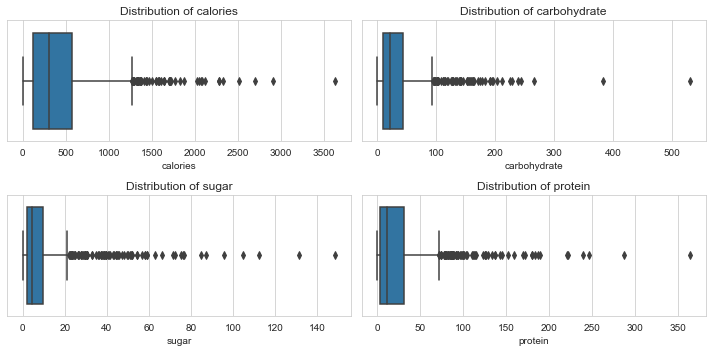

In [173]:
# Columns to visualize for potential outliers
columns_to_check = ['calories', 'carbohydrate', 'sugar', 'protein']

plt.figure(figsize=(10, 5))
for i, col in enumerate(columns_to_check, 1):
    plt.subplot(2, 2, i)
    sns.boxplot(x=df[col])
    plt.title(f'Distribution of {col}')

plt.tight_layout()
plt.show()

<div class="alert alert-info" role="alert">
  <h4 class="alert-heading">Examination of Outliers by Category:</h4>
  
  <p>
    Upon initial analysis, numerous outliers have been identified across individual features within the dataset. To better understand the nature and justification of these outliers, a deeper dive into the different categories is warranted.
  </p>

  <p>
    In the ensuing step, we will scrutinize the outliers within each category to ascertain whether they are justifiable based on the inherent characteristics or business logic pertaining to that category. For instance, certain categories might inherently have higher values for some features, which, while being outliers, could still be legitimate and meaningful for analysis.
  </p>
  
  <p>
    This categorical analysis aims to provide a clearer picture of the data distribution within each category and help determine the appropriate handling of outliers moving forward, ensuring a balanced and accurate representation of the data for subsequent analysis or modeling.
  </p>
  
</div>


In [174]:
def identify_outliers(data):
    Q1 = data.quantile(0.25)
    Q3 = data.quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return data[(data < lower_bound) | (data > upper_bound)]

# Identify outliers for each numerical feature
outliers = {col: identify_outliers(df[col]) for col in df.select_dtypes(include=[np.number]).columns}

# Display the outliers for each feature
outliers_df = pd.DataFrame({col: pd.Series(outliers[col].values) for col in outliers}).fillna('')
outliers_df.head()

,calories,carbohydrate,sugar,protein,servings,healthy,difficulty
0,1695.82,99.82,38.63,113.85,,1.0,3
1,1321.78,95.89,104.91,79.71,,1.0,1
2,1724.25,98.51,27.78,220.14,,1.0,3
3,1279.53,145.32,32.83,82.58,,1.0,1
4,2122.24,190.84,39.54,87.05,,1.0,3


In [175]:
# Extract the categories associated with the identified outliers for each specified feature
outlier_categories = {
    feature: df.loc[outliers[feature].index, "category"].value_counts()
    for feature in ["calories", "carbohydrate", "sugar", "protein"]
}

outlier_categories

{'calories': Chicken          19
 Pork             11
 Meat             10
 One Dish Meal     6
 Lunch/Snacks      4
 Breakfast         3
 Potato            2
 Vegetable         1
 Dessert           1
 Name: category, dtype: int64,
 'carbohydrate': Potato           13
 Dessert          13
 Breakfast        11
 One Dish Meal    10
 Lunch/Snacks      9
 Chicken           3
 Vegetable         3
 Pork              3
 Meat              1
 Name: category, dtype: int64,
 'sugar': Dessert          45
 Beverages        13
 Breakfast         6
 Pork              5
 Meat              4
 Chicken           4
 Lunch/Snacks      3
 Vegetable         2
 One Dish Meal     1
 Name: category, dtype: int64,
 'protein': Chicken          38
 Pork             13
 Meat             12
 One Dish Meal     7
 Lunch/Snacks      3
 Breakfast         2
 Name: category, dtype: int64}

<div class="alert alert-info" role="alert">
  <h4 class="alert-heading">Analysis of Outliers by Food Category:</h4>
  
  <p>
    A meticulous examination of outliers within each food category reveals distinct patterns that align with intuitive nutritional expectations. Below are the notable observations for some key categories and nutrients:
  </p>

  - **Calories**:
    - Substantial outliers observed in categories like `Chicken`, `Pork`, and `Meat`. This is coherent as these food items are typically higher in calories compared to other categories.

  - **Carbohydrates**:
    - Notable outliers found in `Desserts`, `Potatoes`, and `Breakfast` categories. Given the carbohydrate-rich nature of these foods, the outliers are reasonable.

  - **Sugar**:
    - As anticipated, the `Dessert` category exhibits many outliers, underscoring the higher sugar content inherent to sweet dishes.

  - **Protein**:
    - The `Chicken` category shows numerous outliers, which is consistent with the high protein content commonly associated with poultry.

  <p>
    The outliers, in most cases, reflect the inherent nutritional properties of the respective food categories. This analysis supports the argument that while these data points are statistically outliers, they are logically justifiable and provide valuable insights into the nutritional variations across different food categories.
  </p>
  
  <p>
    Moving forward, these observations will be instrumental in making informed decisions on how to handle outliers in the dataset, ensuring the preservation of critical nutritional information while enhancing the data's consistency and reliability for subsequent analyses.
  </p>

</div>


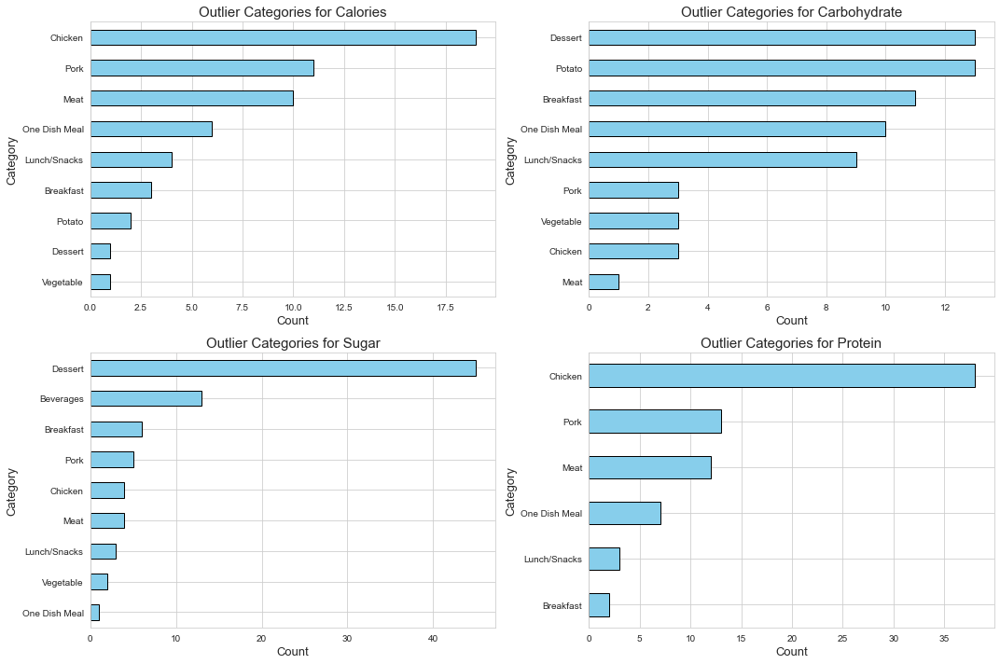

In [176]:
# Plot bar plots for each feature to display the categories of the identified outliers
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(15, 10))

features = ["calories", "carbohydrate", "sugar", "protein"]
axis_mapping = {(0, 0): "calories", (0, 1): "carbohydrate", (1, 0): "sugar", (1, 1): "protein"}

for ax_coords, feature in axis_mapping.items():
    ax = axes[ax_coords]
    outlier_categories[feature].sort_values(ascending=True).plot(kind='barh', ax=ax, color='skyblue', edgecolor='black')
    ax.set_title(f'Outlier Categories for {feature.capitalize()}', fontsize=15)
    ax.set_xlabel('Count', fontsize=13)
    ax.set_ylabel('Category', fontsize=13)

plt.tight_layout()
plt.show()


<div class="alert alert-info" role="alert">
  <h4 class="alert-heading">Outliers Removal Strategy by Category:</h4>
  
  <p>
    A tailored outliers removal approach is adopted, leveraging a 3 Interquartile Range (3IQR) rule to identify and exclude outliers within each category separately. This method ensures a nuanced and category-specific handling of outliers, respecting the inherent nutritional variance among different food categories.
  </p>

  <p>
    The process is delineated as follows:
  </p>

  - **Category-wise Outliers Removal**:
    - For each category, such as `Dessert`, `Meat`, `Vegetables`, etc., the nutritional columns `'sugar'`, `'carbohydrate'`, `'calories'`, and `'protein'` will be scrutinized.
    - Outliers within each category and nutrient will be identified using the 3IQR rule.
    - Identified outliers will be removed from the dataset, enhancing the data quality and accuracy for that particular category.

  <p>
    This meticulous approach ensures that the outliers removal process is sensitive to the nutritional characteristics inherent to each food category, thereby preserving the dataset's integrity while optimizing it for subsequent analysis and modeling.
  </p>
  
  <p>
    Implementation of this strategy aims at achieving a more refined, reliable, and category-accurate dataset, paving the way for robust and insightful downstream analyses.
  </p>
  
</div>


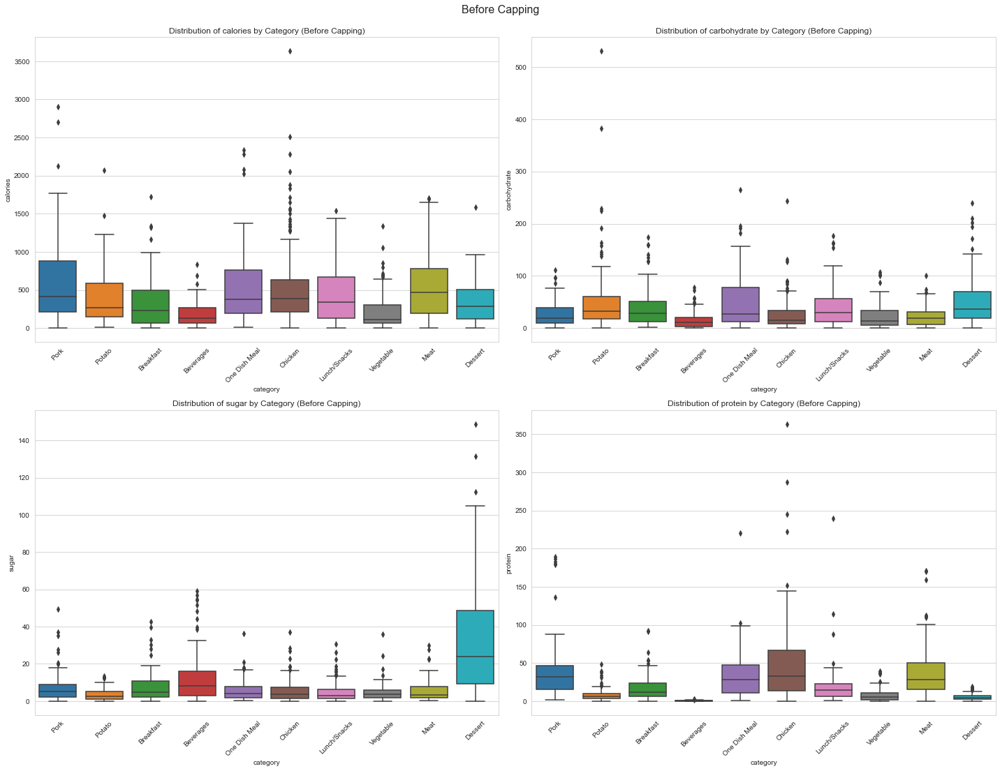

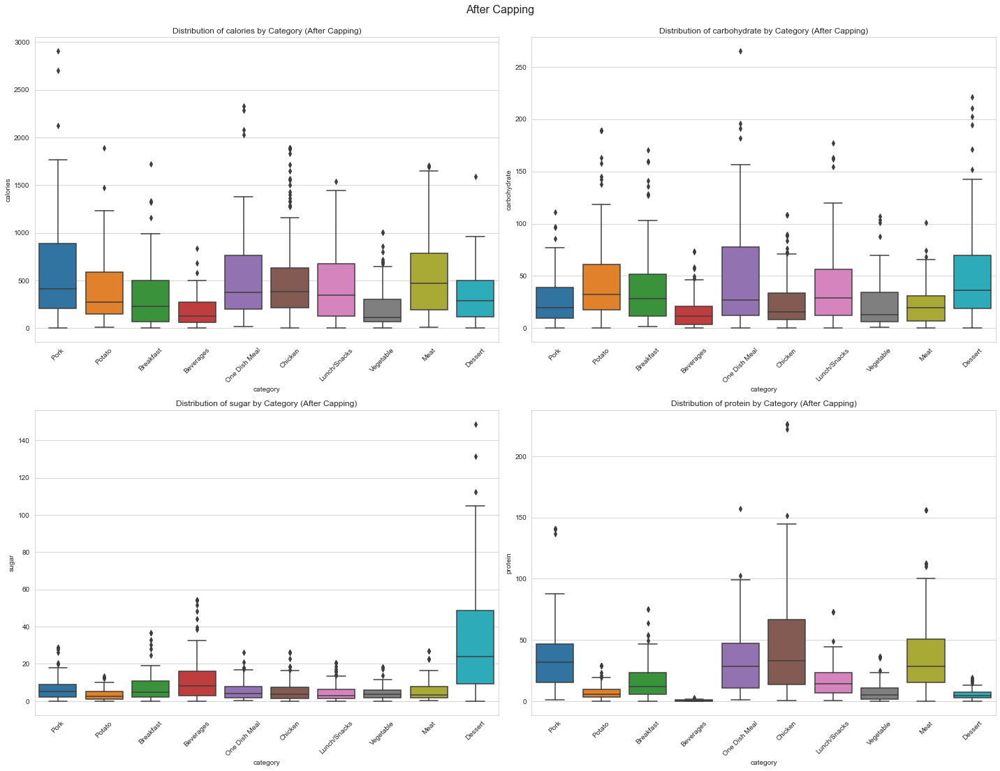

In [177]:
columns_to_check = ['calories', 'carbohydrate', 'sugar', 'protein']

# Visualize the distributions before capping using boxplots (Before Capping)
plt.figure(figsize=(20, 15))
for i, col in enumerate(columns_to_check, 1):
    plt.subplot(2, 2, i)
    sns.boxplot(data=df, x='category', y=col)
    plt.title(f'Distribution of {col} by Category (Before Capping)')
    plt.xticks(rotation=45)

plt.tight_layout()
plt.suptitle('Before Capping', y=1.02, fontsize=16)
plt.show()

# Capping outliers based on the IQR method for each category separately
for category in df['category'].unique():
    subset = df[df['category'] == category]
    
    for col in columns_to_check:
        Q1 = subset[col].quantile(0.25)
        Q3 = subset[col].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 3 * IQR
        upper_bound = Q3 + 3 * IQR

        # Update the main dataframe
        df.loc[(df['category'] == category) & (df[col] < lower_bound), col] = lower_bound
        df.loc[(df['category'] == category) & (df[col] > upper_bound), col] = upper_bound

# Visualize the distributions after capping using boxplots (After Capping)
plt.figure(figsize=(20, 15))
for i, col in enumerate(columns_to_check, 1):
    plt.subplot(2, 2, i)
    sns.boxplot(data=df, x='category', y=col)
    plt.title(f'Distribution of {col} by Category (After Capping)')
    plt.xticks(rotation=45)

plt.tight_layout()
plt.suptitle('After Capping', y=1.02, fontsize=16)
plt.show()


## Gaussian Distribution 

<div class="alert alert-info" role="alert">
  <h4 class="alert-heading">Benefits of Normal Distribution in Statistical Analysis:</h4>
  
  <p>
    Adhering to a normal distribution in data analysis is beneficial for several reasons, some of which are highlighted below:
  </p>

  - **Statistical Power**:
    - Parametric tests, which assume Gaussian distributions, possess higher statistical power compared to their non-parametric counterparts. This implies that they have a heightened likelihood of detecting an effect, should one exist, thus enhancing the accuracy and reliability of the analysis.

  - **Model Assumptions**:
    - Many statistical techniques and models operate under the assumption that errors or residuals follow a normal distribution. If this assumption is violated, the model may yield unreliable or incorrect estimates, thereby compromising the validity of the findings.

  - **Stabilized Variance**:
    - Transformations that lead to normality often stabilize the variance within the data. Stabilized variance is a pivotal assumption in certain models and contributes to the robustness and reliability of the model’s estimates.

  <p>
    In summation, striving for normality in data distribution is a prudent approach to ensure that the assumptions underlying many statistical models and tests


In [178]:
from scipy.stats import boxcox

columns_to_transform = ['calories', 'carbohydrate', 'sugar', 'protein']

for col in columns_to_transform:
    # Ensure all values are positive by adding a small constant
    data = df[col] + 1e-5

    # Apply the Box-Cox transformation
    df[f'bc_{col}'], _ = boxcox(data)


In [179]:
# test for normality
# Testing for normality 'log_calories', 'log_sugar'
columns_to_test = ['bc_calories', 'bc_carbohydrate', 'bc_sugar', 'bc_protein']

for column in columns_to_test:
    stat, p = shapiro(df[column])
    print(f"Shapiro-Wilk Test for {column}:")
    print(f"Statistic = {stat:.5f}, p-value = {p:.5f}")
    if p > 0.05:
        print(f"{column} looks Gaussian (fail to reject H0)\n")
    else:
        print(f"{column} does not look Gaussian (reject H0)\n")

Shapiro-Wilk Test for bc_calories:
Statistic = 0.99756, p-value = 0.17327
bc_calories looks Gaussian (fail to reject H0)

Shapiro-Wilk Test for bc_carbohydrate:
Statistic = 0.99829, p-value = 0.47651
bc_carbohydrate looks Gaussian (fail to reject H0)

Shapiro-Wilk Test for bc_sugar:
Statistic = 0.99704, p-value = 0.07765
bc_sugar looks Gaussian (fail to reject H0)

Shapiro-Wilk Test for bc_protein:
Statistic = 0.99705, p-value = 0.07941
bc_protein looks Gaussian (fail to reject H0)



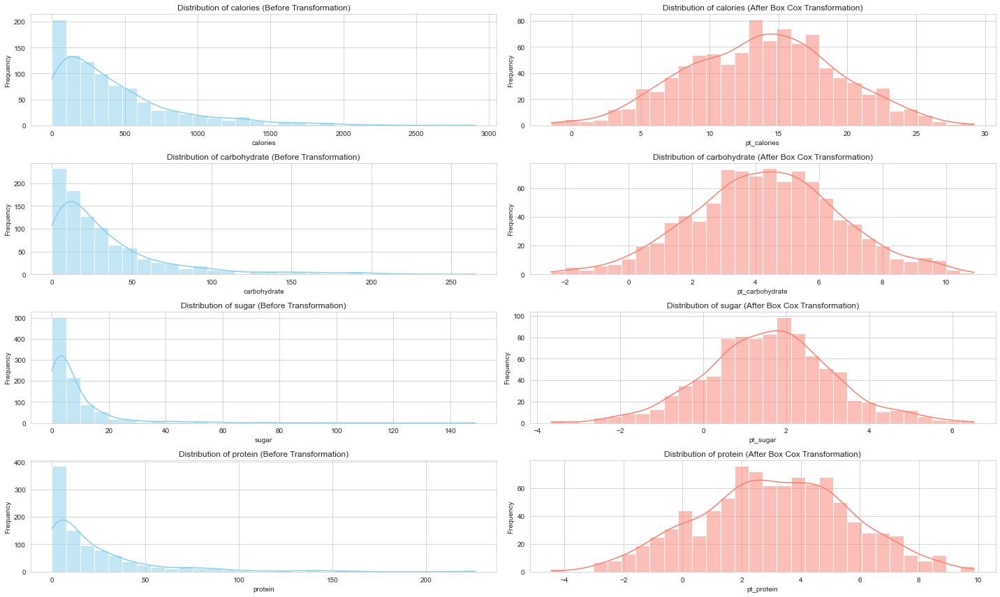

In [180]:
# Initialize the figure
plt.figure(figsize=(20, 12))

# List of columns to plot
columns_to_plot = ['calories', 'carbohydrate', 'sugar', 'protein']

# Plotting histograms for each column: Before vs After Transformation
for i, col in enumerate(columns_to_plot, 1):
    # Before Transformation
    plt.subplot(4, 2, 2*i-1)
    sns.histplot(df[col], bins=30, kde=True, color='skyblue')
    plt.title(f'Distribution of {col} (Before Transformation)')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    
    # After Transformation
    plt.subplot(4, 2, 2*i)
    sns.histplot(df[f'bc_{col}'], bins=30, kde=True, color='salmon')
    plt.title(f'Distribution of {col} (After Box Cox Transformation)')
    plt.xlabel(f'pt_{col}')
    plt.ylabel('Frequency')

plt.tight_layout()
plt.show()


The code executes independent t-tests to assess the mean differences in nutritional variables— `'calories'`, `'carbohydrate'`, `'sugar'`, and `'protein'` between **High Traffic** and **Low Traffic** groups. The key findings are:

- 🍔 **Calories**: Significant difference (p-value: 0.029)
- 🍞 **Carbohydrate**: No significant difference (p-value: 0.069)
- 🍭 **Sugar**: Significant difference (p-value: 0.041)
- 🍖 **Protein**: Significant difference (p-value: < 0.001)

The p-values indicate whether the mean differences are statistically significant, with a threshold of 0.05.


In [181]:
# use statistcal test t-test to compare means of high traffic and low traffic in calories, carbohydrates, sugar, and protein
# t-test for 'calories'
high_traffic_calories = df[df['high_traffic'] == 'High']['bc_calories']
low_traffic_calories = df[df['high_traffic'] == 'Low']['bc_calories']

ttest_ind(high_traffic_calories, low_traffic_calories)

# t-test for 'carbohydrate'
high_traffic_carbohydrate = df[df['high_traffic'] == 'High']['bc_carbohydrate']
low_traffic_carbohydrate = df[df['high_traffic'] == 'Low']['bc_carbohydrate']

ttest_ind(high_traffic_carbohydrate, low_traffic_carbohydrate)

# t-test for 'sugar'
high_traffic_sugar = df[df['high_traffic'] == 'High']['bc_sugar']
low_traffic_sugar = df[df['high_traffic'] == 'Low']['bc_sugar']

ttest_ind(high_traffic_sugar, low_traffic_sugar)

# t-test for 'protein'
high_traffic_protein = df[df['high_traffic'] == 'High']['bc_protein']
low_traffic_protein = df[df['high_traffic'] == 'Low']['bc_protein']

ttest_ind(high_traffic_protein, low_traffic_protein)

# print t-statistic and p-value for each variable
print('Calories: ', ttest_ind(high_traffic_calories, low_traffic_calories))
print('Carbohydrate: ', ttest_ind(high_traffic_carbohydrate, low_traffic_carbohydrate))
print('Sugar: ', ttest_ind(high_traffic_sugar, low_traffic_sugar))
print('Protein: ', ttest_ind(high_traffic_protein, low_traffic_protein))

Calories:  Ttest_indResult(statistic=2.189290647751571, pvalue=0.028819693082585973)
Carbohydrate:  Ttest_indResult(statistic=1.8174680691463687, pvalue=0.06946205140270381)
Sugar:  Ttest_indResult(statistic=-2.045618810201556, pvalue=0.04107032206171404)
Protein:  Ttest_indResult(statistic=4.009822952736458, pvalue=6.555502555582848e-05)


# Explorative Analysis 

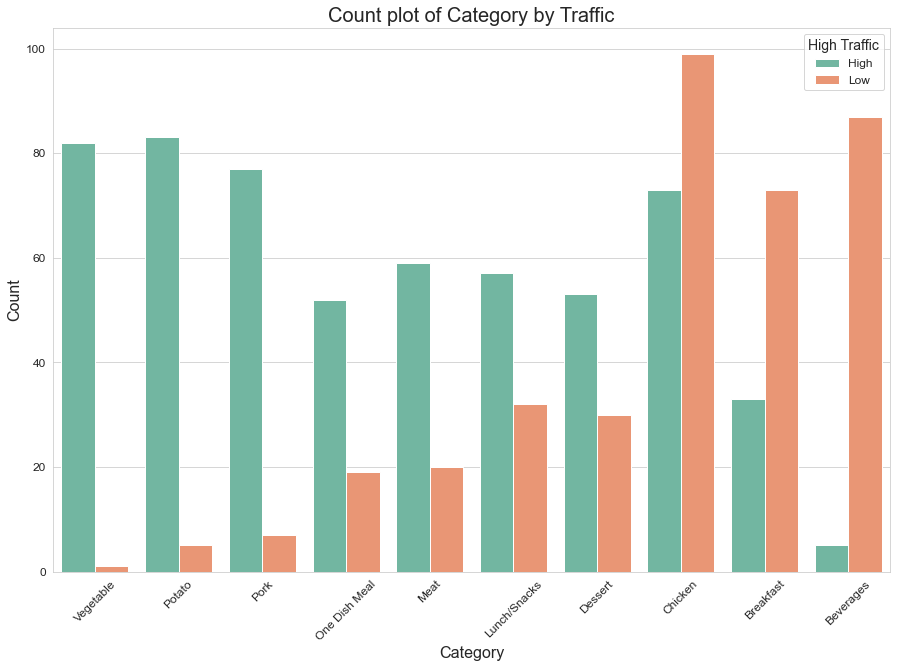

In [182]:
# get countplot to check relationship between high traffic and category

sns.set_style("whitegrid")

# Create the count plot
plt.figure(figsize=(15, 10))  # Set the figure size
sns.countplot(
    data=df,
    x=df['category'].sort_values(ascending=False),
    hue=df['high_traffic'],
    palette="Set2"  # Set color palette for hue
)

# Customize the plot
plt.title('Count plot of Category by Traffic', fontsize=20)  # Set title and font size
plt.xlabel('Category', fontsize=16)  # Set x-axis label and font size
plt.ylabel('Count', fontsize=16)  # Set y-axis label and font size
plt.xticks(rotation=45, fontsize=12)  # Rotate x-axis labels and set font size
plt.yticks(fontsize=12)  # Set y-axis tick label font size
plt.legend(title='High Traffic', title_fontsize='14', fontsize='12')  # Customize legend

# Display the plot
plt.show()


The analysis employing the Chi-Squared statistic (χ² = 318) reveals a significant association between the recipe category and website traffic levels, substantiated by a p-value below 0.05. This p-value enables us to reject the null hypothesis, signifying a notable correlation between the variables in question.
It evidently corroborates the statistical inference, manifesting a robust association between the `category` and `high_traffic` variables. 


In [183]:
contingency_table = pd.crosstab(df['category'], df['high_traffic'])
chi2, p, dof, expected = chi2_contingency(contingency_table)
chi2, p

(318.2935223075692, 3.417304408371102e-63)

Servings of 4 seems to be the most common, and the others are more equally distributed. 

<AxesSubplot:xlabel='servings', ylabel='count'>

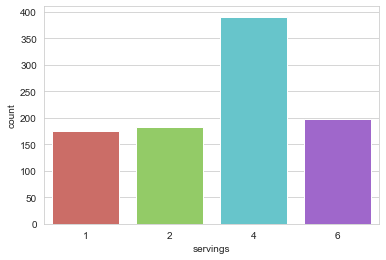

In [184]:
# servings plot
sns.countplot(x='servings', data=df, palette='hls')

Among high traffic and servings there is not a big difference to be observed and it looks servings do not play a role on traffic.

<AxesSubplot:xlabel='servings'>

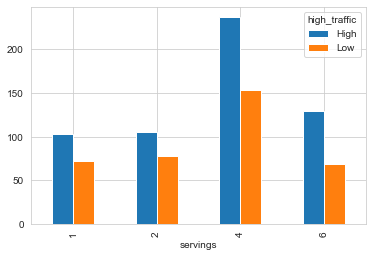

In [185]:
#bar chart of servings with high traffic
pd.crosstab(df.servings, df.high_traffic).plot(kind='bar')

📈 Results:

Chi-Squared Statistic (χ²): 2.74
P-value: 0.434
The p-value of 0.434, which is above the commonly used significance level of 0.05, suggests that we fail to reject the null hypothesis, implying that there isn't a statistically significant association between the servings and high_traffic variables.

In [186]:
contingency_table = pd.crosstab(df['servings'], df['high_traffic'])
chi2, p, dof, expected = chi2_contingency(contingency_table)
chi2, p

(2.7369889309788054, 0.4339779666711946)

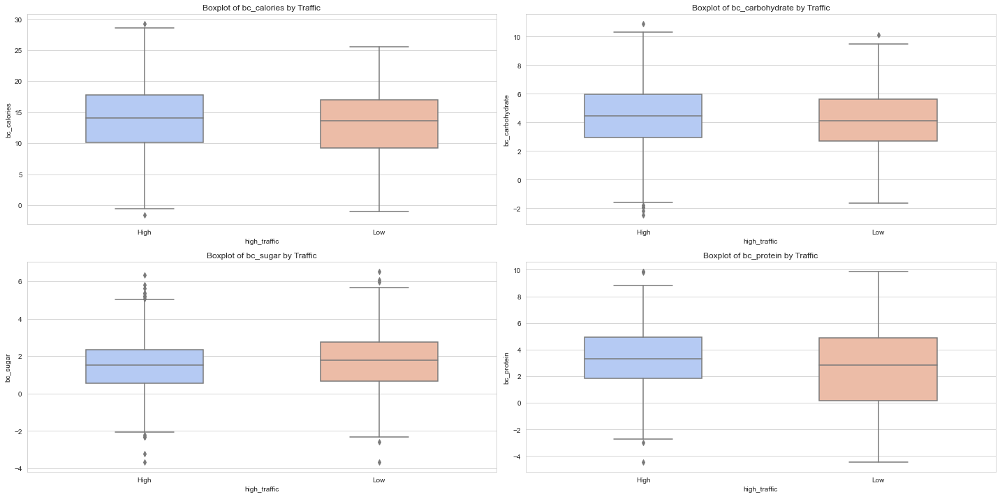

In [187]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set the style for seaborn plots
sns.set_style("whitegrid")

# Create a larger figure
plt.figure(figsize=(20, 10))

# List of features to plot
features = ['bc_calories', 'bc_carbohydrate', 'bc_sugar', 'bc_protein']

# Loop through each feature and create a boxplot with swarm
for i, feature in enumerate(features, 1):
    plt.subplot(2, 2, i)
    sns.boxplot(x='high_traffic', y=feature, data=df, width=0.5, palette="coolwarm")
    #sns.swarmplot(x='high_traffic', y=feature, data=df, color=".25")
    plt.title(f'Boxplot of {feature} by Traffic')

plt.tight_layout()
plt.show()


In [188]:
# Create a copy of the original DataFrame
df_temp = df.copy()

# Convert 'High' and 'Low' to 1 and 0, respectively, in the temporary DataFrame
df_temp['high_traffic'] = df_temp['high_traffic'].map({'High': 1, 'Low': 0})


In [189]:
import pandas as pd
from scipy import stats

# Assuming df is your dataframe
results = {}

features = ['bc_calories', 'bc_carbohydrate', 'bc_sugar', 'bc_protein']

for feature in features:
    group1 = df_temp[df_temp['high_traffic'] == 0][feature]
    group2 = df_temp[df_temp['high_traffic'] == 1][feature]
    
    t_stat, p_value = stats.ttest_ind(group1, group2)
    
    results[feature] = {
        't_stat': t_stat,
        'p_value': p_value
    }

# Printing the results
for feature, result in results.items():
    print(f"For {feature}:")
    print(f"\tT-statistic: {result['t_stat']}")
    print(f"\tP-value: {result['p_value']}")


For bc_calories:
	T-statistic: -2.189290647751571
	P-value: 0.028819693082585973
For bc_carbohydrate:
	T-statistic: -1.8174680691463687
	P-value: 0.06946205140270381
For bc_sugar:
	T-statistic: 2.045618810201556
	P-value: 0.04107032206171404
For bc_protein:
	T-statistic: -4.009822952736458
	P-value: 6.555502555582848e-05


The statistical analysis reveals distinct patterns in nutritional variables between the two traffic groups:

- 🍔 **bc_calories**: Exhibits statistically significant differences between the groups at the 5% significance level.
- 🍞 **bc_carbohydrate**: Does not show a statistically significant difference at the 5% level, although it's borderline.
- 🍭 **bc_sugar**: Displays statistically significant differences between the groups at the 5% significance level.
- 🍖 **bc_protein**: Indicates a highly significant difference between the two groups, underscoring a notable variance in protein content relative to traffic levels.


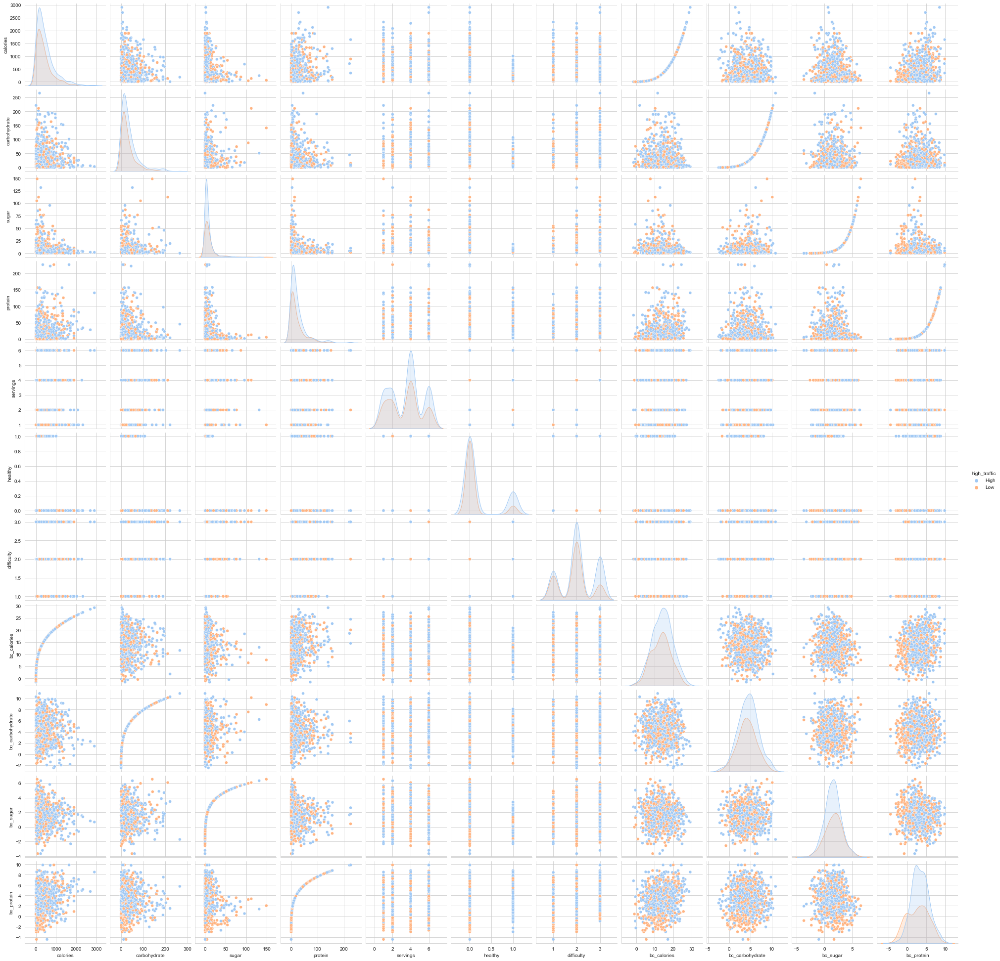

In [190]:
#searborn pairplot
sns.pairplot(df, hue = 'high_traffic', palette="pastel")
plt.show()

### Analysis of Nutritional Variables:

#### Original Nutritional Variables:

- **Calories**:
  - The distributions for both high and low traffic recipes are right-skewed, with high traffic recipes exhibiting a slightly broader spread.

- **Carbohydrate**:
  - Right-skewed distributions are observed for both traffic types, though high traffic recipes present a more even spread.

- **Sugar**:
  - Both traffic types exhibit highly right-skewed distributions, with a notable peak in the lower sugar range.

- **Protein**:
  - The distributions are right-skewed, with high traffic recipes displaying a broader spread.

#### Box-Cox Transformed Nutritional Variables:

- **Calories**:
  - Post-transformation, the distribution appears more symmetric, especially for high traffic recipes.

- **Carbohydrate**:
  - The transformation renders the distribution for high traffic recipes more symmetrical, while some skewness persists for low traffic recipes.

- **Sugar**:
  - The distribution has become more symmetric for both high and low traffic recipes post-transformation.

- **Protein**:
  - A more symmetrical distribution is observed post-transformation, especially for the high traffic recipes.
  
The Box-Cox transformation evidently mitigates skewness in the data, enhancing the symmetry of the distributions which could potentially lead to more reliable analytical insights.


In [191]:
pd.set_option('display.max_columns', None)
df.head()

,calories,carbohydrate,sugar,protein,category,servings,high_traffic,healthy,difficulty,bc_calories,bc_carbohydrate,bc_sugar,bc_protein
recipe,,,,,,,,,,,,,
1,538.52,11.83,2.53,35.12,Pork,6,High,0,3,16.981785,3.273629,0.973724,5.217116
2,35.48,38.56,0.66,0.92,Potato,4,High,0,2,6.088769,5.583407,-0.406793,-0.082670
3,914.28,42.68,3.09,2.88,Breakfast,1,Low,0,1,20.230823,5.811021,1.195857,1.179840
4,97.03,30.56,38.63,0.02,Beverages,4,High,0,2,9.203565,5.080651,4.430681,-2.700211
5,27.05,1.85,0.80,0.53,Beverages,4,Low,0,2,5.387038,0.658361,-0.220604,-0.595684


In [192]:
# convert with one hot encoding category,servings, high_traffic, use 0 and 1
df = pd.get_dummies(df, columns=['category'], drop_first=False)
df = pd.get_dummies(df, columns=['high_traffic'], drop_first=False)
df.head()

,calories,carbohydrate,sugar,protein,servings,healthy,difficulty,bc_calories,bc_carbohydrate,bc_sugar,bc_protein,category_Beverages,category_Breakfast,category_Chicken,category_Dessert,category_Lunch/Snacks,category_Meat,category_One Dish Meal,category_Pork,category_Potato,category_Vegetable,high_traffic_High,high_traffic_Low
recipe,,,,,,,,,,,,,,,,,,,,,,,
1,538.52,11.83,2.53,35.12,6,0,3,16.981785,3.273629,0.973724,5.217116,0,0,0,0,0,0,0,1,0,0,1,0
2,35.48,38.56,0.66,0.92,4,0,2,6.088769,5.583407,-0.406793,-0.082670,0,0,0,0,0,0,0,0,1,0,1,0
3,914.28,42.68,3.09,2.88,1,0,1,20.230823,5.811021,1.195857,1.179840,0,1,0,0,0,0,0,0,0,0,0,1
4,97.03,30.56,38.63,0.02,4,0,2,9.203565,5.080651,4.430681,-2.700211,1,0,0,0,0,0,0,0,0,0,1,0
5,27.05,1.85,0.80,0.53,4,0,2,5.387038,0.658361,-0.220604,-0.595684,1,0,0,0,0,0,0,0,0,0,0,1


In [193]:
# replace False with 0 and True with 1 on all columns
df = df.replace(False, 0)
df = df.replace(True, 1)

In [194]:
#drop high_traffic_High
df.drop(columns=['high_traffic_Low'], inplace=True)

In [195]:
# rename high_traffic_High to high_traffic
df.rename(columns={'high_traffic_High': 'high_traffic'}, inplace=True)


In [196]:
#check for missing values
df.isnull().sum()

calories                  0
carbohydrate              0
sugar                     0
protein                   0
servings                  0
healthy                   0
difficulty                0
bc_calories               0
bc_carbohydrate           0
bc_sugar                  0
bc_protein                0
category_Beverages        0
category_Breakfast        0
category_Chicken          0
category_Dessert          0
category_Lunch/Snacks     0
category_Meat             0
category_One Dish Meal    0
category_Pork             0
category_Potato           0
category_Vegetable        0
high_traffic              0
dtype: int64

## Correlation Analysis with High Traffic

The overall correlation between various categories and the high traffic to the website isn't significantly high (above 0.5). However, certain categories exhibit a noticeable correlation with website traffic. The correlation coefficients for these categories are as follows:

- 🍹 **category_Beverages**: -0.38
- 🌽 **category_Vegetable**: 0.24
- 🥔 **category_Potato**: 0.22
- 🍳 **category_Breakfast**: -0.21

From the above data, it's discernible that the website traffic tends to decrease when `Beverages` and `Breakfast` categories are displayed, while it tends to increase when `Vegetables` and `Potatoes` categories are showcased. This insight could be instrumental in understanding user preferences and optimizing content display for enhanced user engagement.


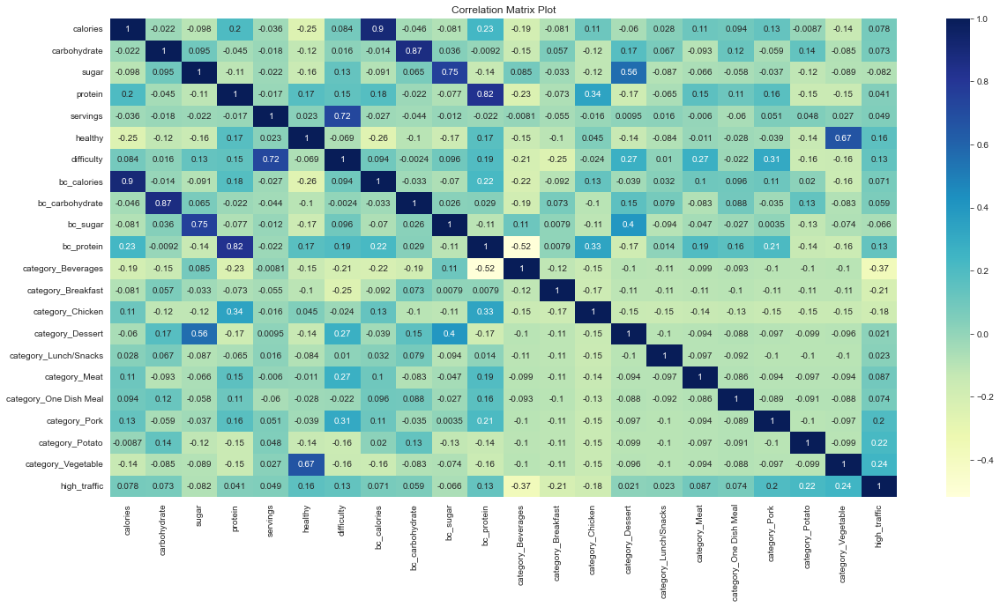

In [197]:
# show correlation matrix plot of all variables
plt.figure(figsize=(20, 10))
sns.heatmap(df.corr(), annot=True, cmap="YlGnBu")
plt.title("Correlation Matrix Plot")
plt.show()


In [199]:
# aboslute high correlation  values with 'high_traffic' above abs values 0.001
high_corr = df.corr()['high_traffic'].abs().sort_values(ascending=False)
high_corr = high_corr[high_corr > 0.001]
high_corr


high_traffic              1.000000
category_Beverages        0.370437
category_Vegetable        0.242208
category_Potato           0.220794
category_Breakfast        0.214204
category_Pork             0.198287
category_Chicken          0.175195
healthy                   0.155584
difficulty                0.134022
bc_protein                0.129344
category_Meat             0.086880
sugar                     0.081839
calories                  0.078336
category_One Dish Meal    0.073573
carbohydrate              0.073337
bc_calories               0.071038
bc_sugar                  0.066397
bc_carbohydrate           0.059019
protein                   0.040916
Name: high_traffic, dtype: float64

In [198]:
# remove category_Dessert  and category_Lunch/Snacks since low correlation with 'high_traffic'
df.drop(columns=['category_Dessert', 'category_Lunch/Snacks', 'servings'], inplace=True)

In [203]:
# Drop  log_protein, log_carbohydrates, sugar, log_calories,  'carbohydrate', 'sugar'
df.drop([ 'protein','carbohydrate','sugar','calories'], axis=1, inplace=True)

## Model development 

# <a id='toc5_'></a>[Model Fitting and Evaluation](#toc0_)

1. Problem Definition:
Predicting high traffic for a recipe can be framed as a binary classification task.

2. Baseline Model - Logistic Regression:
Given the dataset's characteristics and the demand for model interpretability, I've chosen Logistic Regression as our baseline model. This choice is rooted in the following:

Logistic Regression is inherently designed for binary outcomes.
It offers probabilities which are both interpretable and calibratable.
It excels in scenarios where a linear decision boundary separates classes.
3. Comparison Model - Voting Classifier:
For a more robust prediction, I've experimented with multiple models. By employing a VotingClassifier, I harnessed the combined strength of these models to enhance prediction accuracy.

4. Evaluation Metrics:
Considering the class imbalance and our specific goal of accurately predicting high traffic recipes at least 80% of the time, I've selected the following metrics for evaluation:

F1-Score: Balances precision and recall, making it superior to accuracy, especially for imbalanced datasets.
ROC-AUC: Offers insights into the model's ability to differentiate between high and low traffic recipes.
Additionally, we'll keep tabs on Accuracy, Precision, and Recall to ensure comprehensive and precise predictions.


# <a id='toc6_'></a>[Prepare Data for Modelling](#toc0_)
To facilitate the prediction of whether a recipe will lead to high traffic, we selected features like calories, sugar, carbohydrates, and protein among others, with high_traffic as the target variable. To further refine our dataset for modeling, the following transformations were applied:

Standardization of Numeric Features: Given the varied scales of our numeric features, we standardized them to have a mean of 0 and a standard deviation of 1. This ensures that all features contribute equally to the model's performance.

Encoding Categorical Variables: Any categorical variables in our dataset were converted into numeric representations, ensuring our models can process them effectively.

Data Splitting: To evaluate our model's performance on unseen data, we split the dataset into a training set (to train the model) and a test set (to evaluate the model).



In [204]:
# Split the data into training and test sets
X = df.drop('high_traffic', axis=1)
y = df['high_traffic']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42, stratify=y)

# Standardize the features
#scaler = StandardScaler()
scaler = MinMaxScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [205]:
# Get the value counts for each class
class_counts = y.value_counts()

# Calculate the percentage distribution of each class
class_percentage = (class_counts / len(y)) * 100
class_percentage

1    60.61246
0    39.38754
Name: high_traffic, dtype: float64

## Logistic Regression

In [244]:

# Initialize and fit the baseline model: Logistic Regression
logreg = LogisticRegression(class_weight='balanced')
logreg.fit(X_train, y_train)

# Predict on the test set
y_pred_baseline = logreg.predict(X_test)

# Evaluate the performance of the baseline model
accuracy_baseline = f1_score(y_test, y_pred_baseline)
accuracy_baseline

0.7999999999999998

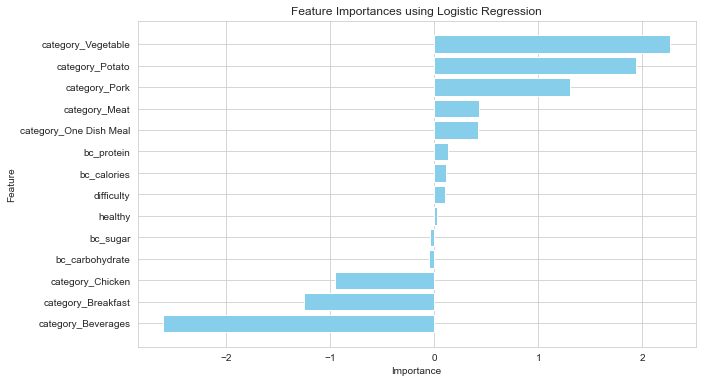

In [245]:
# Get the feature importances
feature_importances = logreg.coef_[0]

# Create a DataFrame for visualization
features_df = pd.DataFrame({
    'Feature': X.columns,
    'Importance': feature_importances
})

# Sort the DataFrame by importance
features_df = features_df.sort_values(by='Importance', ascending=False)

# Plot the feature importances
plt.figure(figsize=(10,6))
plt.barh(features_df['Feature'], features_df['Importance'], color='skyblue')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Feature Importances using Logistic Regression')
plt.gca().invert_yaxis()  # Highest importances at the top
plt.show()

In [246]:
# Define the metrics
scoring_metrics = {
    'f1': 'f1',
    'f1_weighted': 'f1_weighted',
    'roc_auc': 'roc_auc',
    'neg_log_loss': 'neg_log_loss',
    'accuracy': 'accuracy',
    'precision': 'precision',
    'recall': 'recall',
    'auc': 'roc_auc'
}

# Evaluate the model using cross-validation
scores = {}
for metric_name, metric in scoring_metrics.items():
    cv_score = cross_val_score(logreg, X_train, y_train, cv=5, scoring=metric)
    scores[metric_name] = cv_score.mean()

scores


{'f1': 0.7791968622798672,
 'f1_weighted': 0.7336441584745771,
 'roc_auc': 0.8139151951298178,
 'neg_log_loss': -0.5188375662250481,
 'accuracy': 0.7341535657325131,
 'precision': 0.7857861430883744,
 'recall': 0.7757716049382717,
 'auc': 0.8139151951298178}

In [247]:
# check classifcation model
print(classification_report(y_test, y_pred_baseline))


              precision    recall  f1-score   support

           0       0.68      0.75      0.71       112
           1       0.83      0.77      0.80       173

    accuracy                           0.76       285
   macro avg       0.76      0.76      0.76       285
weighted avg       0.77      0.76      0.77       285



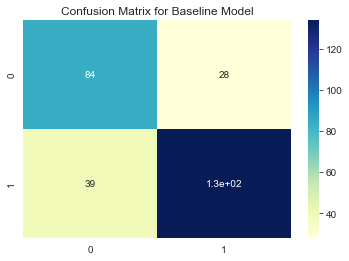

In [248]:
# confusion matrix heatmap
cm_baseline = confusion_matrix(y_test, y_pred_baseline)
sns.heatmap(cm_baseline, annot=True, cmap="YlGnBu")
plt.title("Confusion Matrix for Baseline Model")
plt.show()


## LinearSVC

In [267]:
from sklearn.svm import LinearSVC
from sklearn.metrics import f1_score, classification_report
from sklearn.model_selection import cross_val_score

# Initialize and fit the model
lsvc = LinearSVC(class_weight='balanced')
lsvc.fit(X_train, y_train)

# Predict on the test set
y_pred_lsvc = lsvc.predict(X_test)

# Evaluate the performance of the model using f1_score
accuracy_lsvc = f1_score(y_test, y_pred_lsvc)
print("F1 Score:", accuracy_lsvc)

# Define scoring metrics that do not require probability estimates
# For example: 'accuracy', 'f1', 'precision', 'recall'
scoring_metrics = {
    'accuracy': 'accuracy',
    'f1': 'f1',
    'precision': 'precision',
    'recall': 'recall'
}

# Evaluate the model using cross-validation
scores = {}
for metric_name, metric in scoring_metrics.items():
    cv_score = cross_val_score(lsvc, X_train, y_train, cv=5, scoring=metric)
    scores[metric_name] = cv_score.mean()

print("Cross-validation Scores:", scores)

# Print classification report
print(classification_report(y_test, y_pred_lsvc))



F1 Score: 0.7999999999999998
Cross-validation Scores: {'accuracy': 0.7251196172248804, 'f1': 0.7666713995051623, 'precision': 0.7903970824272548, 'recall': 0.7483641975308641}
              precision    recall  f1-score   support

           0       0.68      0.75      0.71       112
           1       0.83      0.77      0.80       173

    accuracy                           0.76       285
   macro avg       0.76      0.76      0.76       285
weighted avg       0.77      0.76      0.77       285



## Naive Bayes Classifier

In [250]:
# bernoulli naive bayes classifier
import warnings
warnings.filterwarnings("ignore", message="size changed, may indicate binary incompatibility. Expected 56 from C header, got 64 from PyObject")

# define model
model = BernoulliNB(alpha=0.255)
# define evaluation procedure
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=42)
# evaluate model
scores = cross_val_score(model, X, y, scoring='f1', cv=cv, n_jobs=-1)
# summarize performance
print('Mean F1: %.3f' % np.mean(scores))

#predict on test set
model.fit(X_train, y_train)
y_pred = model.predict(X_test)

# check classifcation model
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))


Mean F1: 0.795
              precision    recall  f1-score   support

           0       0.68      0.70      0.69       112
           1       0.80      0.79      0.80       173

    accuracy                           0.75       285
   macro avg       0.74      0.74      0.74       285
weighted avg       0.76      0.75      0.75       285



Bernoulli NB

In [254]:
from sklearn.naive_bayes import BernoulliNB
from sklearn.model_selection import RepeatedStratifiedKFold, GridSearchCV

# Suppress the specific warning
import warnings
warnings.filterwarnings("ignore", message="size changed, may indicate binary incompatibility. Expected 56 from C header, got 64 from PyObject")

# Define hyperparameters to be tuned
param_grid_nb = {
    'alpha': np.linspace(1e-3, 1, 100)
}


# Define evaluation procedure
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=42)

# Initialize GridSearchCV with the BernoulliNB model
grid_search_nb = GridSearchCV(BernoulliNB(), param_grid_nb, scoring='f1', cv=cv, n_jobs=-1)
grid_search_nb.fit(X_train, y_train)

# Get the best parameters from the grid search
best_params_nb = grid_search_nb.best_params_

best_params_nb

{'alpha': 0.9192727272727274}

In [255]:
mean_cv_score

0.7952732041901506

In [257]:
# Initialize and fit the BernoulliNB model with the best parameters
best_nb = BernoulliNB(**best_params_nb)
best_nb.fit(X_train, y_train)

# Evaluate the model using cross-validation
cv_scores = cross_val_score(best_nb, X, y, scoring='f1', cv=cv, n_jobs=-1)
mean_cv_score = np.mean(cv_scores)
print('Mean F1: %.3f' % mean_cv_score)


Mean F1: 0.795


In [258]:
# Predict on the test set
y_pred_best_nb = best_nb.predict(X_test)

# Print the classification report
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred_best_nb))


              precision    recall  f1-score   support

           0       0.68      0.70      0.69       112
           1       0.80      0.79      0.79       173

    accuracy                           0.75       285
   macro avg       0.74      0.74      0.74       285
weighted avg       0.75      0.75      0.75       285



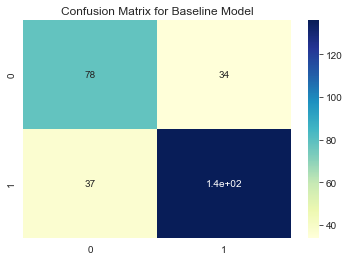

In [260]:
# confusion matrix heatmap
cm_baseline = confusion_matrix(y_test, y_pred_best_nb)
sns.heatmap(cm_baseline, annot=True, cmap="YlGnBu")
plt.title("Confusion Matrix for Baseline Model")
plt.show()

## SDG classifier

In [271]:
#SDG classifier


# define model
model = SGDClassifier()
# define evaluation procedure
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=42)
# evaluate model
scores = cross_val_score(model, X, y, scoring='f1', cv=cv, n_jobs=1)
# summarize performance
print('Mean F1: %.3f' % np.mean(scores))

#predict on test set
model.fit(X_train, y_train)
y_pred = model.predict(X_test)

# check classifcation model
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))


<frozen importlib._bootstrap>:228: RuntimeWarning: scipy._lib.messagestream.MessageStream size changed, may indicate binary incompatibility. Expected 56 from C header, got 64 from PyObject
<frozen importlib._bootstrap>:228: RuntimeWarning: scipy._lib.messagestream.MessageStream size changed, may indicate binary incompatibility. Expected 56 from C header, got 64 from PyObject
<frozen importlib._bootstrap>:228: RuntimeWarning: scipy._lib.messagestream.MessageStream size changed, may indicate binary incompatibility. Expected 56 from C header, got 64 from PyObject
<frozen importlib._bootstrap>:228: RuntimeWarning: scipy._lib.messagestream.MessageStream size changed, may indicate binary incompatibility. Expected 56 from C header, got 64 from PyObject
<frozen importlib._bootstrap>:228: RuntimeWarning: scipy._lib.messagestream.MessageStream size changed, may indicate binary incompatibility. Expected 56 from C header, got 64 from PyObject
<frozen importlib._bootstrap>:228: RuntimeWarning: scip

Mean F1: 0.699
              precision    recall  f1-score   support

           0       0.64      0.79      0.71       112
           1       0.84      0.72      0.78       173

    accuracy                           0.75       285
   macro avg       0.74      0.76      0.74       285
weighted avg       0.77      0.75      0.75       285



In [273]:
from sklearn.linear_model import SGDClassifier
from sklearn.model_selection import RepeatedStratifiedKFold, GridSearchCV, cross_val_score
from sklearn.metrics import classification_report
import numpy as np

# Define the model
model = SGDClassifier()

# Define the parameter grid
param_grid = {
    'loss': ['hinge', 'log', 'modified_huber', 'squared_hinge', 'perceptron'],
    'penalty': ['l2', 'l1', 'elasticnet'],
    'alpha': [0.0001, 0.001, 0.01, 0.1],
    'max_iter': [500, 1000, 1500],
    'tol': [1e-3, 1e-4, 1e-5],
    'learning_rate': ['constant', 'optimal', 'invscaling', 'adaptive'],
    'eta0': [0.01, 0.1, 1]
}

# Define the evaluation procedure
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=42)

# Setup GridSearchCV
grid_search = GridSearchCV(model, param_grid, scoring='f1', cv=cv, n_jobs=-1)

# Fit GridSearchCV
grid_search.fit(X_train, y_train)

# Get the best model
best_model = grid_search.best_estimator_

# Evaluate model using cross-validation
scores = cross_val_score(best_model, X, y, scoring='f1', cv=cv, n_jobs=-1)

# Summarize performance
print('Best Parameters:', grid_search.best_params_)
print('Mean F1 (CV): %.3f' % np.mean(scores))

# Predict on test set using the best model
y_pred = best_model.predict(X_test)

# Print classification report
print(classification_report(y_test, y_pred))


<frozen importlib._bootstrap>:228: RuntimeWarning: scipy._lib.messagestream.MessageStream size changed, may indicate binary incompatibility. Expected 56 from C header, got 64 from PyObject
<frozen importlib._bootstrap>:228: RuntimeWarning: scipy._lib.messagestream.MessageStream size changed, may indicate binary incompatibility. Expected 56 from C header, got 64 from PyObject
<frozen importlib._bootstrap>:228: RuntimeWarning: scipy._lib.messagestream.MessageStream size changed, may indicate binary incompatibility. Expected 56 from C header, got 64 from PyObject
<frozen importlib._bootstrap>:228: RuntimeWarning: scipy._lib.messagestream.MessageStream size changed, may indicate binary incompatibility. Expected 56 from C header, got 64 from PyObject
<frozen importlib._bootstrap>:228: RuntimeWarning: scipy._lib.messagestream.MessageStream size changed, may indicate binary incompatibility. Expected 56 from C header, got 64 from PyObject
<frozen importlib._bootstrap>:228: RuntimeWarning: scip

Best Parameters: {'alpha': 0.001, 'eta0': 0.1, 'learning_rate': 'constant', 'loss': 'hinge', 'max_iter': 1000, 'penalty': 'elasticnet', 'tol': 0.0001}
Mean F1 (CV): 0.686
              precision    recall  f1-score   support

           0       0.68      0.75      0.71       112
           1       0.83      0.77      0.80       173

    accuracy                           0.76       285
   macro avg       0.76      0.76      0.76       285
weighted avg       0.77      0.76      0.77       285



## Extra Tree classifier

In [277]:

# Define the model
model = ExtraTreesClassifier()

# Define the parameter grid
param_grid = {
    'n_estimators': [100, 250, 500],
    'criterion': ['gini', 'entropy'],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Define the evaluation procedure
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=42)

# Setup GridSearchCV
grid_search = GridSearchCV(model, param_grid, scoring='f1', cv=cv, n_jobs=-1)

# Fit GridSearchCV
grid_search.fit(X_train, y_train)

# Get the best model
best_model = grid_search.best_estimator_

# Evaluate model using cross-validation
scores = cross_val_score(best_model, X, y, scoring='f1', cv=cv, n_jobs=-1)

# Summarize performance
print('Best Parameters:', grid_search.best_params_)
print('Mean F1 (CV): %.3f' % np.mean(scores))

# Predict on test set using the best model
y_pred = best_model.predict(X_test)

# Print classification report
print(classification_report(y_test, y_pred))

Best Parameters: {'criterion': 'gini', 'max_depth': 10, 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 250}
Mean F1 (CV): 0.807
              precision    recall  f1-score   support

           0       0.70      0.75      0.72       112
           1       0.83      0.79      0.81       173

    accuracy                           0.78       285
   macro avg       0.77      0.77      0.77       285
weighted avg       0.78      0.78      0.78       285



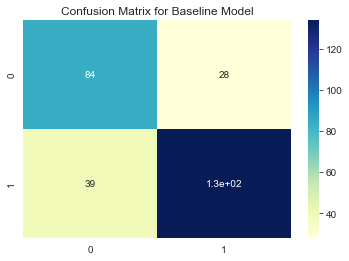

In [281]:
# confusion matrix heatmap
cm_baseline = confusion_matrix(y_test, y_pred)
sns.heatmap(cm_baseline, annot=True, cmap="YlGnBu")
plt.title("Confusion Matrix for Baseline Model")
plt.show()

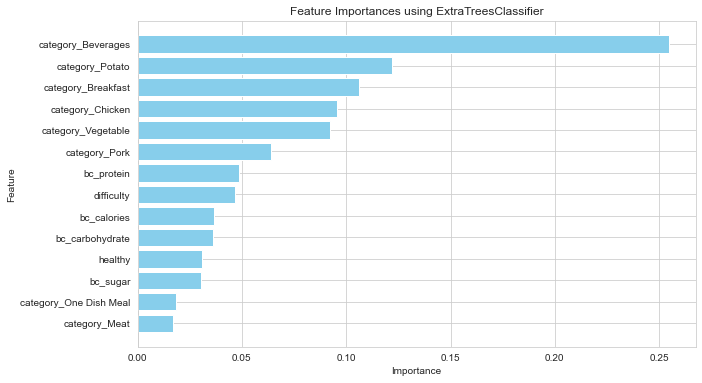

In [280]:
# Extract feature importances from the best model
importances = best_model.feature_importances_

# Create a DataFrame for visualization
features_df = pd.DataFrame({
    'Feature': X.columns,  # Assuming X is a DataFrame. If not, replace this with the list of feature names
    'Importance': importances
})

# Sort the DataFrame by importance
features_df = features_df.sort_values(by='Importance', ascending=False)

# Plot the feature importances
plt.figure(figsize=(10, 6))
plt.barh(features_df['Feature'], features_df['Importance'], color='skyblue')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Feature Importances using ExtraTreesClassifier')
plt.gca().invert_yaxis()  # Highest importances at the top



# Gradient Boosting Classifier

In [215]:
# Build a model with GradientBoostingClassifier


# define model
model = GradientBoostingClassifier(n_estimators=30, max_depth=4)
# define evaluation procedure
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=42)
# evaluate model
scores = cross_val_score(model, X, y, scoring='f1', cv=cv, n_jobs=-1)
# summarize performance
print('Mean F1: %.3f' % np.mean(scores))

#predict on test set
model.fit(X_train, y_train)
y_pred = model.predict(X_test)

# check classifcation model
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))


Mean F1: 0.800
              precision    recall  f1-score   support

           0       0.66      0.68      0.67       112
           1       0.79      0.77      0.78       173

    accuracy                           0.74       285
   macro avg       0.72      0.73      0.73       285
weighted avg       0.74      0.74      0.74       285



In [285]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import RepeatedStratifiedKFold, GridSearchCV, cross_val_score
from sklearn.metrics import classification_report
import numpy as np

# Define the model
model = GradientBoostingClassifier()

# Define the parameter grid
param_grid = {
    'n_estimators': [10, 30, 50, 100],
    'max_depth': [3, 4, 5, 6],
    'learning_rate': [0.001, 0.01, 0.1, 1],
    'subsample': [0.8, 0.9, 1.0],
    'min_samples_split': [2, 4, 6],
    'min_samples_leaf': [1, 2, 4]
}

# Define the evaluation procedure
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=42)

# Setup GridSearchCV
grid_search = GridSearchCV(model, param_grid, scoring='f1', cv=cv, n_jobs=-1)

# Fit GridSearchCV
grid_search.fit(X_train, y_train)

# Get the best model
best_model = grid_search.best_estimator_

# Evaluate model using cross-validation
scores = cross_val_score(best_model, X, y, scoring='f1', cv=cv, n_jobs=-1)

# Summarize performance
print('Best Parameters:', grid_search.best_params_)
print('Mean F1 (CV): %.3f' % np.mean(scores))

# Predict on test set using the best model
y_pred = best_model.predict(X_test)

# Print classification report
print(classification_report(y_test, y_pred))


<frozen importlib._bootstrap>:228: RuntimeWarning: scipy._lib.messagestream.MessageStream size changed, may indicate binary incompatibility. Expected 56 from C header, got 64 from PyObject
<frozen importlib._bootstrap>:228: RuntimeWarning: scipy._lib.messagestream.MessageStream size changed, may indicate binary incompatibility. Expected 56 from C header, got 64 from PyObject
<frozen importlib._bootstrap>:228: RuntimeWarning: scipy._lib.messagestream.MessageStream size changed, may indicate binary incompatibility. Expected 56 from C header, got 64 from PyObject
<frozen importlib._bootstrap>:228: RuntimeWarning: scipy._lib.messagestream.MessageStream size changed, may indicate binary incompatibility. Expected 56 from C header, got 64 from PyObject
<frozen importlib._bootstrap>:228: RuntimeWarning: scipy._lib.messagestream.MessageStream size changed, may indicate binary incompatibility. Expected 56 from C header, got 64 from PyObject
<frozen importlib._bootstrap>:228: RuntimeWarning: scip

Best Parameters: {'learning_rate': 0.1, 'max_depth': 3, 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 30, 'subsample': 1.0}
Mean F1 (CV): 0.805
              precision    recall  f1-score   support

           0       0.69      0.72      0.70       112
           1       0.81      0.79      0.80       173

    accuracy                           0.76       285
   macro avg       0.75      0.75      0.75       285
weighted avg       0.76      0.76      0.76       285



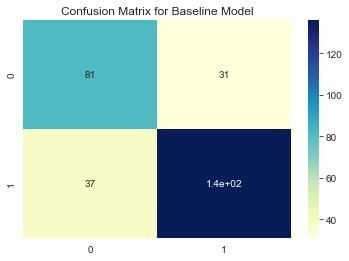

In [286]:
# confusion matrix heatmap
gb_conf = confusion_matrix(y_test, y_pred)
sns.heatmap(gb_conf, annot=True, cmap="YlGnBu")
plt.title("Confusion Matrix for Baseline Model")
plt.show()

## XGBClassifier

In [290]:
#Build model with XGBClassifier

# define model
model = XGBClassifier()
# define evaluation procedure
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=42)
# evaluate model
scores = cross_val_score(model, X, y, scoring='f1', cv=cv, n_jobs=-1)
# summarize performance
print('Mean F1: %.3f' % np.mean(scores))

#predict on test set
model.fit(X_train, y_train)
y_pred = model.predict(X_test)

# check classifcation model
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))


Mean F1: 0.759
              precision    recall  f1-score   support

           0       0.62      0.58      0.60       112
           1       0.74      0.77      0.75       173

    accuracy                           0.69       285
   macro avg       0.68      0.67      0.68       285
weighted avg       0.69      0.69      0.69       285



In [292]:
# Esemble model SGDClassifier and BernoulliNB, measure F1 score, precious, recall, accuracy


# define the base models
models = list()
models.append(('SGDClassifier', SGDClassifier(alpha= 0.001, eta0 = 0.1, learning_rate ='constant', loss = 'hinge', max_iter =1000, penalty = 'elasticnet', tol= 0.0001)))
#models.append(('LinearSVC', LinearSVC(class_weight='balanced')))
models.append(('BernoulliNB', BernoulliNB(**best_params_nb)))
models.append(('LogisticRegression', LogisticRegression(class_weight='balanced')))
models.append(('GradientBoost', GradientBoostingClassifier(learning_rate= 0.1, max_depth= 3, min_samples_leaf= 2, min_samples_split= 2, n_estimators= 30, subsample= 1.0)))
#models.append(('XGBClassifier', XGBClassifier()))
models.append(('ExtraTreesClassifier', ExtraTreesClassifier(criterion = 'gini', max_depth= 10, min_samples_leaf= 2, min_samples_split= 2, n_estimators= 250)))
# define the voting ensemble
ensemble = VotingClassifier(estimators=models, voting='hard')
# define evaluation procedure
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=42)
# evaluate the ensemble
scores = cross_val_score(ensemble, X, y, scoring='f1', cv=cv, n_jobs=-1)
auc = cross_val_score(ensemble, X, y, scoring='roc_auc', cv=cv, n_jobs=-1)
# summarize performance
print('Mean F1: %.3f' % np.mean(scores))
print('Mean AUC: %.3f' % np.mean(auc))
#summarize AUC score
from sklearn.metrics import roc_auc_score
# evaluate each model in turn
results = []
names = []
for name, model in models:
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    f1 = roc_auc_score(y_test, y_pred)
    results.append(f1)
    names.append(name)
    print('%s: %f' % (name, f1))


#predict on test set
ensemble.fit(X_train, y_train)
y_pred = ensemble.predict(X_test)  # Corrected this line

# check classification report
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))


<frozen importlib._bootstrap>:228: RuntimeWarning: scipy._lib.messagestream.MessageStream size changed, may indicate binary incompatibility. Expected 56 from C header, got 64 from PyObject
<frozen importlib._bootstrap>:228: RuntimeWarning: scipy._lib.messagestream.MessageStream size changed, may indicate binary incompatibility. Expected 56 from C header, got 64 from PyObject
<frozen importlib._bootstrap>:228: RuntimeWarning: scipy._lib.messagestream.MessageStream size changed, may indicate binary incompatibility. Expected 56 from C header, got 64 from PyObject
<frozen importlib._bootstrap>:228: RuntimeWarning: scipy._lib.messagestream.MessageStream size changed, may indicate binary incompatibility. Expected 56 from C header, got 64 from PyObject
<frozen importlib._bootstrap>:228: RuntimeWarning: scipy._lib.messagestream.MessageStream size changed, may indicate binary incompatibility. Expected 56 from C header, got 64 from PyObject
<frozen importlib._bootstrap>:228: RuntimeWarning: scip

Mean F1: 0.803
Mean AUC: nan
SGDClassifier: 0.762283
BernoulliNB: 0.741278
LogisticRegression: 0.762283
GradientBoost: 0.754671
ExtraTreesClassifier: 0.773844
              precision    recall  f1-score   support

           0       0.68      0.75      0.71       112
           1       0.83      0.77      0.80       173

    accuracy                           0.76       285
   macro avg       0.76      0.76      0.76       285
weighted avg       0.77      0.76      0.77       285



In [219]:
pip install h2o

Note: you may need to restart the kernel to use updated packages.


In [220]:
import h2o
from h2o.automl import H2OAutoML
h2o.init()
h2o_df = h2o.H2OFrame(df)
# Convert the 'high_traffic' column to a factor (categorical variable)
h2o_df['high_traffic'] = h2o_df['high_traffic'].asfactor()

# Now, split the H2OFrame
train, test = h2o_df.split_frame(ratios=[0.8], seed=1)

# Continue with the rest of your code
aml = H2OAutoML(max_models=10, balance_classes=True, seed=1,nfolds=20,project_name='classification',max_runtime_secs_per_model=1000 )
aml.train(training_frame=train, y='high_traffic')
lb = aml.leaderboard
lb.head(rows=10)

Checking whether there is an H2O instance running at http://localhost:54321. connected.


H2O_cluster_uptime:,6 hours 20 mins
H2O_cluster_timezone:,Europe/Zurich
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.44.0.1
H2O_cluster_version_age:,5 days
H2O_cluster_name:,H2O_from_python_stephaniegessler_j248ca
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,3.167 Gb
H2O_cluster_total_cores:,8
H2O_cluster_allowed_cores:,8
H2O_cluster_status:,"locked, healthy"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
AutoML progress: |
08:14:46.814: New models will be added to existing leaderboard classification@@high_traffic (leaderboard frame=null) with already 12 models.
08:15:08.669: StackedEnsemble_BestOfFamily_2_AutoML_2_20231021_81446 [StackedEnsemble best_of_family_xglm (built with AUTO metalearner, using top model from each algorithm type)] failed: water.exceptions.H2OIllegalArgumentException: Failed to find the xval predictions frame. . .  Looks like keep_cross_validation_predictions wasn't set when building the models, or the frame was deleted.
08:15:08.686: StackedEnsemble_AllModels_2_AutoML_2_20231021_81446 [StackedEnsemble all_xglm (built with AUTO metalearner, using all AutoML models)] failed: water.exceptions.H2OIllegalArgumentException: Failed to find the xval predictions frame. . .  Looks like keep_cross_validation_predictions wasn't set when building the models, or the frame was deleted

model_id,auc,logloss,aucpr,mean_per_class_error,rmse,mse
GBM_14_AutoML_4_20231021_131148,0.820503,0.504034,0.876713,0.316906,0.411285,0.169155
StackedEnsemble_BestOfFamily_1_AutoML_1_20231021_65136,0.818187,0.497201,0.724211,0.252937,0.408756,0.167082
GBM_6_AutoML_2_20231021_81446,0.81804,0.507977,0.733482,0.263275,0.413494,0.170977
StackedEnsemble_AllModels_1_AutoML_1_20231021_65136,0.815826,0.498262,0.722805,0.247827,0.409185,0.167432
GLM_2_AutoML_2_20231021_81446,0.813961,0.496421,0.73199,0.244185,0.408836,0.167146
GBM_10_AutoML_3_20231021_111502,0.813917,0.511358,0.737309,0.272086,0.416082,0.173124
GBM_2_AutoML_1_20231021_65136,0.812581,0.511214,0.74571,0.283717,0.415625,0.172744
GLM_3_AutoML_3_20231021_111502,0.811501,0.496663,0.727154,0.24348,0.408656,0.167
GBM_11_AutoML_3_20231021_111502,0.811042,0.51599,0.737082,0.282425,0.417268,0.174113
GBM_16_AutoML_4_20231021_131148,0.810573,0.517283,0.869288,0.308917,0.417787,0.174546


Stacked Ensembles
Ensemble machine learning methods use multiple learning algorithms to obtain better predictive performance than the ones that could be obtained from any of the constituent learning algorithms. Many of the popular modern machine learning algorithms are actually ensembles. For example, Random Forest and Gradient Boosting Machine (GBM) are both ensemble learners. Both bagging (e.g., Random Forest) and boosting (e.g., GBM) are methods for ensembling that take a collection of weak learners (e.g., decision tree) and form a single, strong learner.

H2O's Stacked Ensemble method is a supervised ensemble machine learning algorithm that finds the optimal combination of a collection of prediction algorithms using a process called stacking. Like all supervised models in H2O, Stacked Ensemble supports regression, binary classification, and multiclass classification. If you would like to know more, make sure to check the Stacked Ensemble Section in the H2O-3 Documentation.

In [306]:
best_model = aml.get_best_model()

By looking at the leaderboard, we can see that the best model is the Stacked Ensemble with the best model from each family, meaning that this model was built using the best model of each of the trained algorithms. This Ensemble will usually have a GLM, a Distributed Random Forest, Extremely-Randomized Forest, a GBM, and XGBoost, and Deep Learning model if you give it enough time to train all those models. Let's explore the coefficients of the metalearner to see the models in the Stacked Ensemble with their relative importance.

In [307]:
# Get model ids for all models in the AutoML Leaderboard
model_ids = list(aml.leaderboard['model_id'].as_data_frame().iloc[:,0])

# Get the "All Models","StackedEnsemble_BestOfFamily"  Stacked Ensemble model or 
#se = h2o.get_model([mid for mid in model_ids if "StackedEnsemble_BestOfFamily" in mid][0])

# Get the Stacked Ensemble metalearner model
#metalearner = h2o.get_model(se.metalearner()['name'])
#metalearner.coef()

# Get model ids for all models in the AutoML Leaderboard
model_ids = list(aml.leaderboard['model_id'].as_data_frame().iloc[:, 0])

# Find the Stacked Ensemble model (if it exists)
se_model_ids = [mid for mid in model_ids if "StackedEnsemble_BestOfFamily" in mid]
if se_model_ids:
    se = h2o.get_model(se_model_ids[0])

    # Get the Stacked Ensemble metalearner model
    metalearner = h2o.get_model(se.metalearner()['name'])
    metalearner.coef()
else:
    print("No Stacked Ensemble model found in the leaderboard.")


/Users/stephaniegessler/opt/anaconda3/lib/python3.9/site-packages/h2o/estimators/stackedensemble.py:945: H2ODeprecationWarning: The usage of stacked_ensemble.metalearner()['name'] will be deprecated. Metalearner now returns the metalearner object. If you need to get the 'name' please use stacked_ensemble.metalearner().model_id
  warnings.warn(


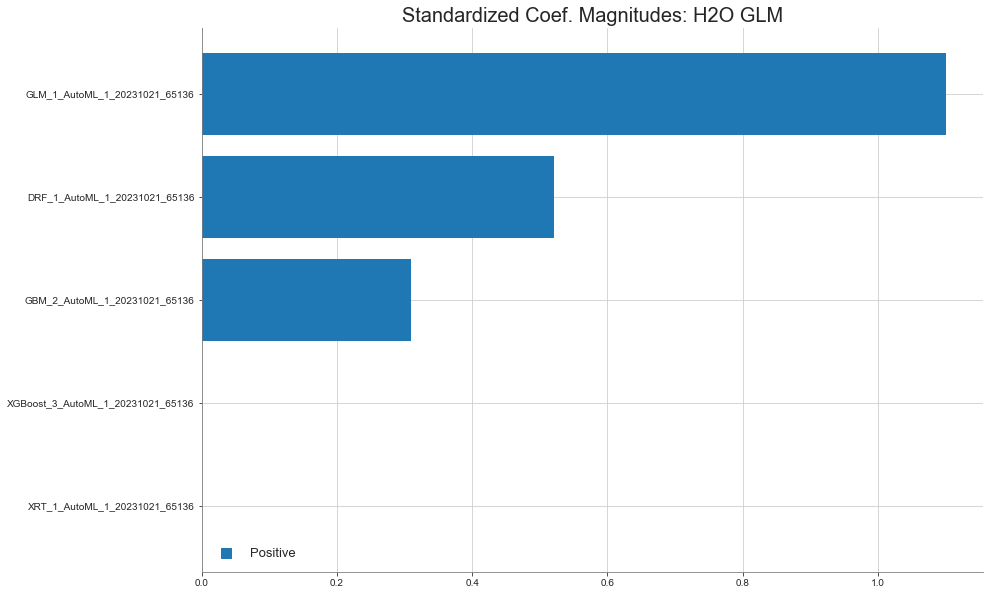

In [308]:
metalearner.std_coef_plot()


In [309]:
aml.leader

Model Details
=============
H2OGradientBoostingEstimator : Gradient Boosting Machine
Model Key: GBM_14_AutoML_4_20231021_131148


Model Summary: 
    number_of_trees    number_of_internal_trees    model_size_in_bytes    min_depth    max_depth    mean_depth    min_leaves    max_leaves    mean_leaves
--  -----------------  --------------------------  ---------------------  -----------  -----------  ------------  ------------  ------------  -------------
    30                 30                          11777                  7            7            7             18            35            26.5

ModelMetricsBinomial: gbm
** Reported on train data. **

MSE: 0.11437810658038972
RMSE: 0.33819832433113817
LogLoss: 0.37431280589553245
Mean Per-Class Error: 0.12370596729580216
AUC: 0.951058106898796
AUCPR: 0.9546301699888572
Gini: 0.902116213797592

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.6211477925374351
       0    1    Error    Rate
-----  ---  ---  -------  -------------
0      398  41   0.0934   (41.0/439.0)
1      69   379  0.154    (69.0/448.0)
Total  467  420  0.124    (110.0/887.0)

Maximum Metrics: Maximum metrics at their respective thresholds
metric                       threshold    value     idx
---------------------------  -----------  --------  -----
max f1                       0.621148     0.873272  184
max f2                       0.432468     0.922882  256
max f0point5                 0.685117     0.901416  153
max accuracy                 0.621148     0.875986  184
max precision                0.976229     1         0
max recall                   0.279691     1         316
max specificity              0.976229     1         0
max absolute_mcc             0.621148     0.753608  184
max min_per_class_accuracy   0.599048     0.870159  195
max mean_per_class_accuracy  0.621148     0.876294  184
max tns                      0.976229     439       0
max fns                      0.976229     446       0
max fps                      0.0566846    439       399
max tps                      0.279691     448       316
max tnr                      0.976229     1         0
max fnr                      0.976229     0.995536  0
max fpr                      0.0566846    1         399
max tpr                      0.279691     1         316

Gains/Lift Table: Avg response rate: 50.51 %, avg score: 56.72 %
group    cumulative_data_fraction    lower_threshold    lift      cumulative_lift    response_rate    score     cumulative_response_rate    cumulative_score    capture_rate    cumulative_capture_rate    gain      cumulative_gain    kolmogorov_smirnov
-------  --------------------------  -----------------  --------  -----------------  ---------------  --------  --------------------------  ------------------  --------------  -------------------------  --------  -----------------  --------------------
1        0.0101466                   0.969499           1.97991   1.97991            1                0.972159  1                           0.972159            0.0200893       0.0200893                  97.9911   97.9911            0.0200893
2        0.0202931                   0.966568           1.97991   1.97991            1                0.968066  1                           0.970113            0.0200893       0.0401786                  97.9911   97.9911            0.0401786
3        0.0304397                   0.963882           1.97991   1.97991            1                0.965581  1                           0.968602            0.0200893       0.0602679                  97.9911   97.9911            0.0602679
4        0.0405862                   0.96079            1.97991   1.97991            1                0.96252   1                           0.967082            0.0200893       0.0803571                  97.9911   97.9911            0.0803571
5        0.0507328                   0.957238           1.97991   1.97991            1                0.958482  1                           0.965362            0.0200893

In [310]:
# save best model
import os
save_dir = os.getcwd()
model_path = h2o.save_model(model=aml.leader, path=save_dir, force=True)

In [311]:
#load model
model = h2o.load_model('/Users/stephaniegessler/Documents/GitHub/recipe_site_traffic/GBM_14_AutoML_4_20231021_131148')

#show model performance
model.model_performance()
 
    
#show model performance on training data
model.model_performance(train=True)
 
 
#show model performance on test data
model.model_performance(valid=True)
 
 
#show model performance on cross validation data
model.model_performance(xval=True)

ModelMetricsBinomial: gbm
** Reported on cross-validation data. **

MSE: 0.1691554821782896
RMSE: 0.4112851592001462
LogLoss: 0.5040339375088083
Mean Per-Class Error: 0.31690554511278196
AUC: 0.8205034069548872
AUCPR: 0.8767128425299361
Gini: 0.6410068139097744

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3527808427636554
       0    1    Error    Rate
-----  ---  ---  -------  -------------
0      131  173  0.5691   (173.0/304.0)
1      29   419  0.0647   (29.0/448.0)
Total  160  592  0.2686   (202.0/752.0)

Maximum Metrics: Maximum metrics at their respective thresholds
metric                       threshold    value     idx
---------------------------  -----------  --------  -----
max f1                       0.352781     0.805769  299
max f2                       0.295053     0.892784  324
max f0point5                 0.712852     0.796539  143
max accuracy                 0.55055      0.744681  227
max precision                0.981948     1         0
max recall                   0.0905199    1         394
max specificity              0.981948     1         0
max absolute_mcc             0.55055      0.463767  227
max min_per_class_accuracy   0.62159      0.720982  193
max mean_per_class_accuracy  0.699429     0.732437  153
max tns                      0.981948     304       0
max fns                      0.981948     446       0
max fps                      0.0539276    304       399
max tps                      0.0905199    448       394
max tnr                      0.981948     1         0
max fnr                      0.981948     0.995536  0
max fpr                      0.0539276    1         399
max tpr                      0.0905199    1         394

Gains/Lift Table: Avg response rate: 59.57 %, avg score: 61.03 %
group    cumulative_data_fraction    lower_threshold    lift      cumulative_lift    response_rate    score     cumulative_response_rate    cumulative_score    capture_rate    cumulative_capture_rate    gain      cumulative_gain    kolmogorov_smirnov
-------  --------------------------  -----------------  --------  -----------------  ---------------  --------  --------------------------  ------------------  --------------  -------------------------  --------  -----------------  --------------------
1        0.0106383                   0.973601           1.67857   1.67857            1                0.97814   1                           0.97814             0.0178571       0.0178571                  67.8571   67.8571            0.0178571
2        0.0212766                   0.966048           1.67857   1.67857            1                0.969178  1                           0.973659            0.0178571       0.0357143                  67.8571   67.8571            0.0357143
3        0.0305851                   0.963561           1.67857   1.67857            1                0.964796  1                           0.970962            0.015625        0.0513393                  67.8571   67.8571            0.0513393
4        0.0412234                   0.961236           1.67857   1.67857            1                0.962116  1                           0.968679            0.0178571       0.0691964                  67.8571   67.8571            0.0691964
5        0.0505319                   0.957443           1.67857   1.67857            1                0.958592  1                           0.966821            0.015625        0.0848214                  67.8571   67.8571            0.0848214
6        0.101064                    0.937318           1.6344    1.65648            0.973684         0.947676  0.986842                    0.957248            0.0825893       0.167411                   63.4398   65.6485            0.164121
7        0.150266                    0.914011           1.6332    1.64886            0.972973         0.926615  0.982301                    0.947218            0.0803571       0.247768                   63.3205   64.8862            0.241189
8        0.200798                    0

In [312]:
aml.leader.model_performance(test_data=test)

ModelMetricsBinomial: gbm
** Reported on test data. **

MSE: 0.17042388349178691
RMSE: 0.4128242767713485
LogLoss: 0.5086405264476258
Mean Per-Class Error: 0.3695652173913043
AUC: 0.796181274442144
AUCPR: 0.8678534757848557
Gini: 0.5923625488842881

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.1912847550609495
       0    1    Error    Rate
-----  ---  ---  -------  ------------
0      18   51   0.7391   (51.0/69.0)
1      0    126  0        (0.0/126.0)
Total  18   177  0.2615   (51.0/195.0)

Maximum Metrics: Maximum metrics at their respective thresholds
metric                       threshold    value     idx
---------------------------  -----------  --------  -----
max f1                       0.191285     0.831683  176
max f2                       0.191285     0.92511   176
max f0point5                 0.559447     0.812693  129
max accuracy                 0.559447     0.764103  129
max precision                0.974836     1         0
max recall                   0.191285     1         176
max specificity              0.974836     1         0
max absolute_mcc             0.559447     0.477767  129
max min_per_class_accuracy   0.633162     0.710145  109
max mean_per_class_accuracy  0.559447     0.735507  129
max tns                      0.974836     69        0
max fns                      0.974836     125       0
max fps                      0.0654754    69        194
max tps                      0.191285     126       176
max tnr                      0.974836     1         0
max fnr                      0.974836     0.992063  0
max fpr                      0.0654754    1         194
max tpr                      0.191285     1         176

Gains/Lift Table: Avg response rate: 64.62 %, avg score: 62.88 %
group    cumulative_data_fraction    lower_threshold    lift      cumulative_lift    response_rate    score     cumulative_response_rate    cumulative_score    capture_rate    cumulative_capture_rate    gain      cumulative_gain    kolmogorov_smirnov
-------  --------------------------  -----------------  --------  -----------------  ---------------  --------  --------------------------  ------------------  --------------  -------------------------  --------  -----------------  --------------------
1        0.0102564                   0.969762           1.54762   1.54762            1                0.972674  1                           0.972674            0.015873        0.015873                   54.7619   54.7619            0.015873
2        0.0205128                   0.966978           1.54762   1.54762            1                0.969079  1                           0.970877            0.015873        0.031746                   54.7619   54.7619            0.031746
3        0.0307692                   0.966376           1.54762   1.54762            1                0.966597  1                           0.96945             0.015873        0.047619                   54.7619   54.7619            0.047619
4        0.0410256                   0.963808           1.54762   1.54762            1                0.965224  1                           0.968394            0.015873        0.0634921                  54.7619   54.7619            0.0634921
5        0.0512821                   0.961176           0.77381   1.39286            0.5              0.962718  0.9                         0.967259            0.00793651      0.0714286                  -22.619   39.2857            0.0569358
6        0.102564                    0.948354           1.54762   1.47024            1                0.953807  0.95                        0.960533            0.0793651       0.150794                   54.7619   47.0238            0.136301
7        0.153846                    0.935023           1.39286   1.44444            0.9              0.940513  0.933333                    0.95386             0.0714286       0.222222                   39.2857   44.4444            0.193237
8        0.2                         0.901305           1.5

# Confusion Matrix

> Confusion matrix shows a predicted class vs an actual class.

## GBM_14_AutoML_4_20231021_131148

,0,1,Error,Rate
0,18.0,51.0,0.7391,(51.0/69.0)
1,0.0,126.0,0.0,(0.0/126.0)
Total,18.0,177.0,0.2615,(51.0/195.0)


# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

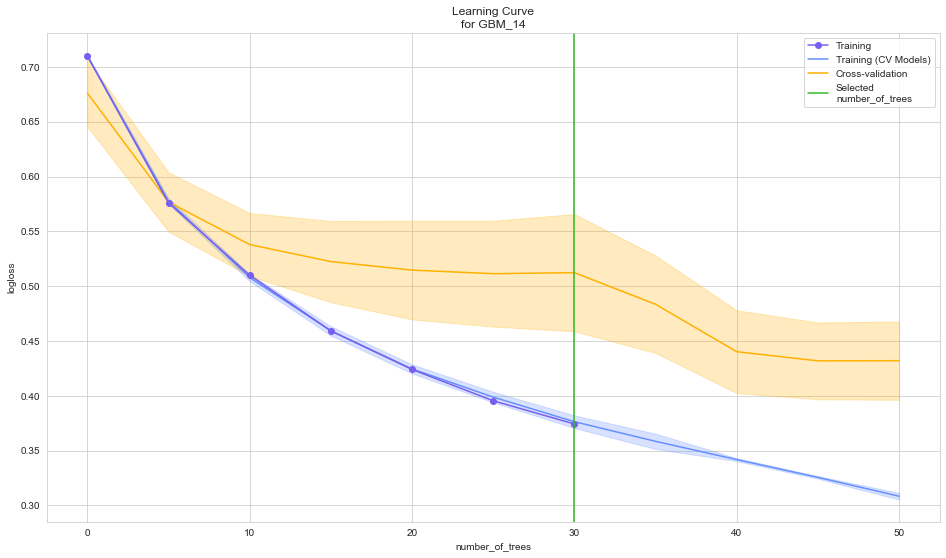

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

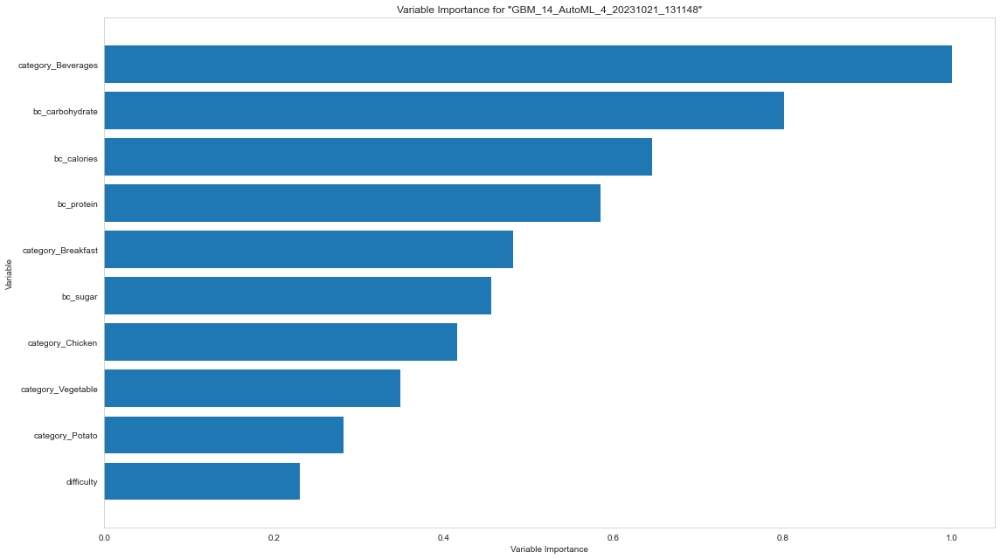

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

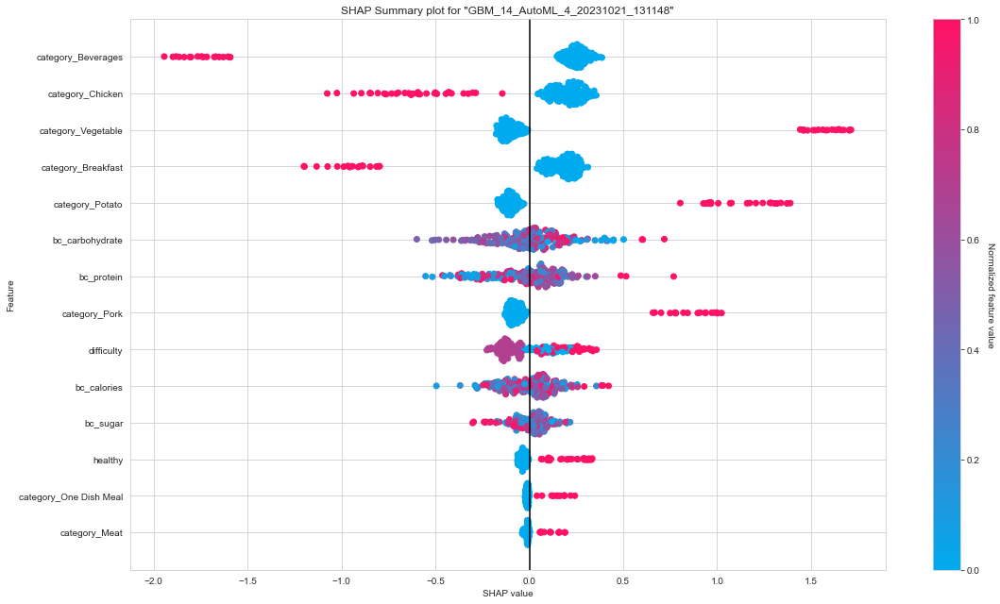

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

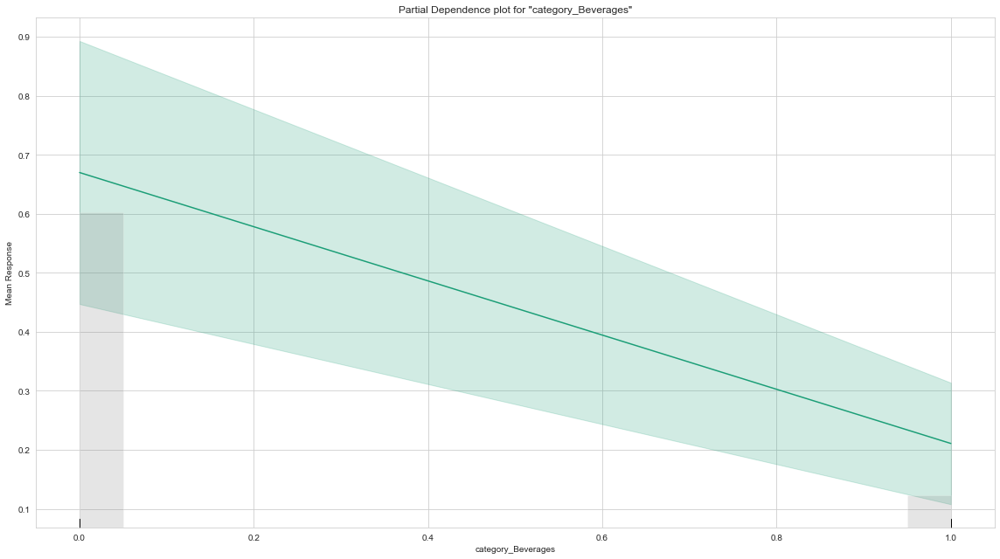

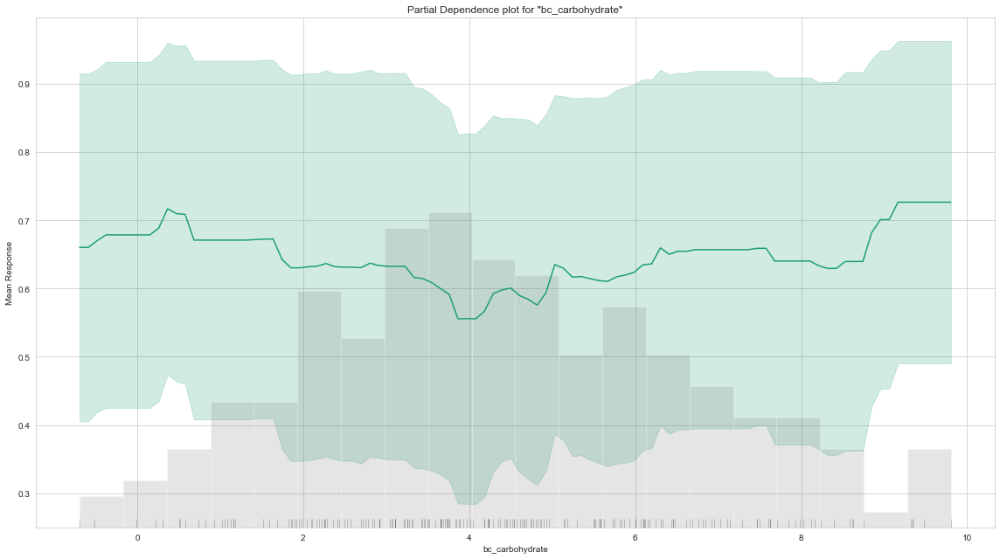

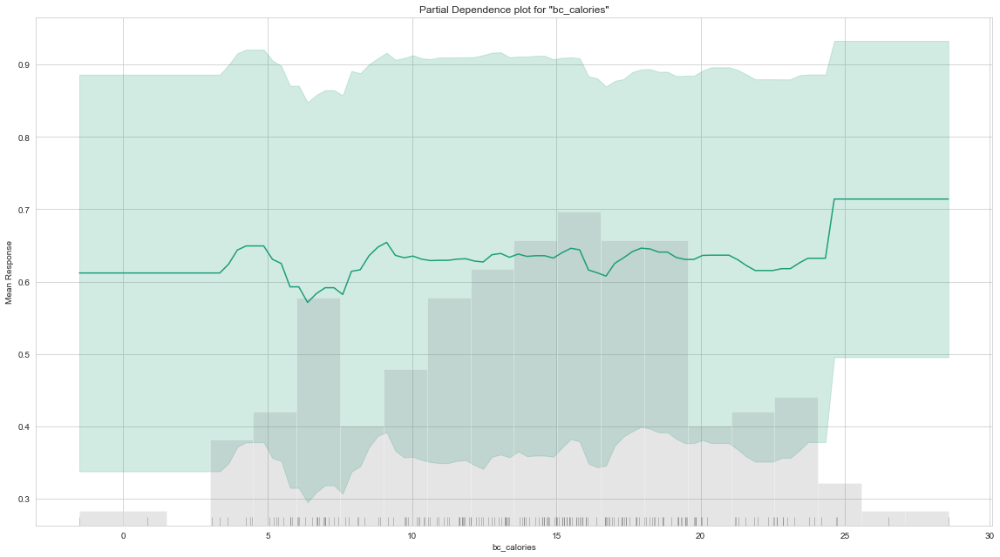

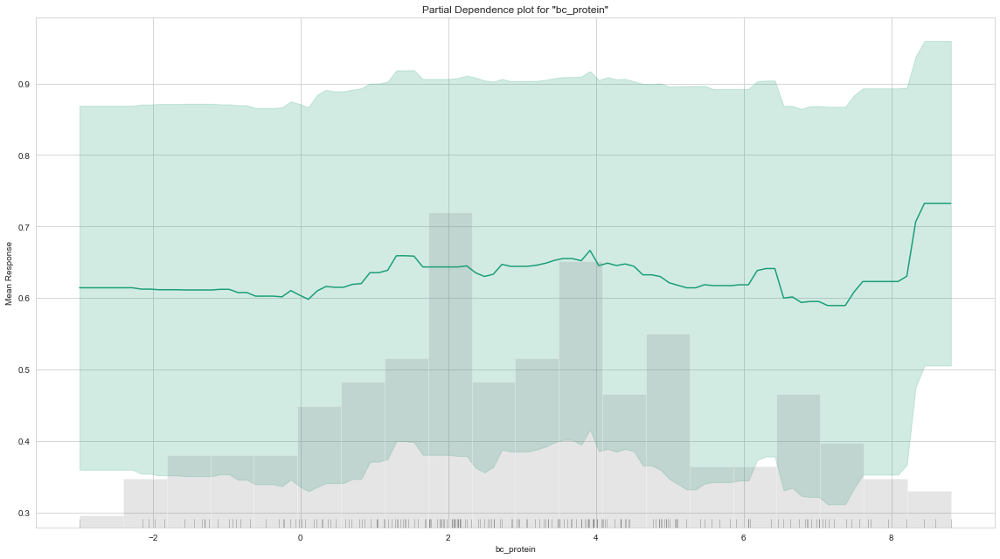

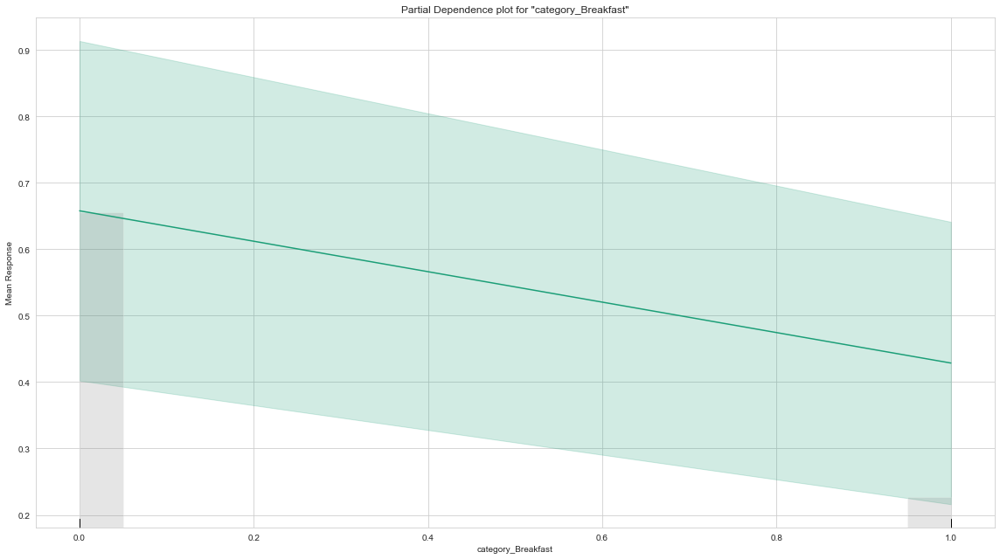

# Confusion Matrix

> Confusion matrix shows a predicted class vs an actual class.

## GBM_14_AutoML_4_20231021_131148

,0,1,Error,Rate
0,18.0,51.0,0.7391,(51.0/69.0)
1,0.0,126.0,0.0,(0.0/126.0)
Total,18.0,177.0,0.2615,(51.0/195.0)


# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

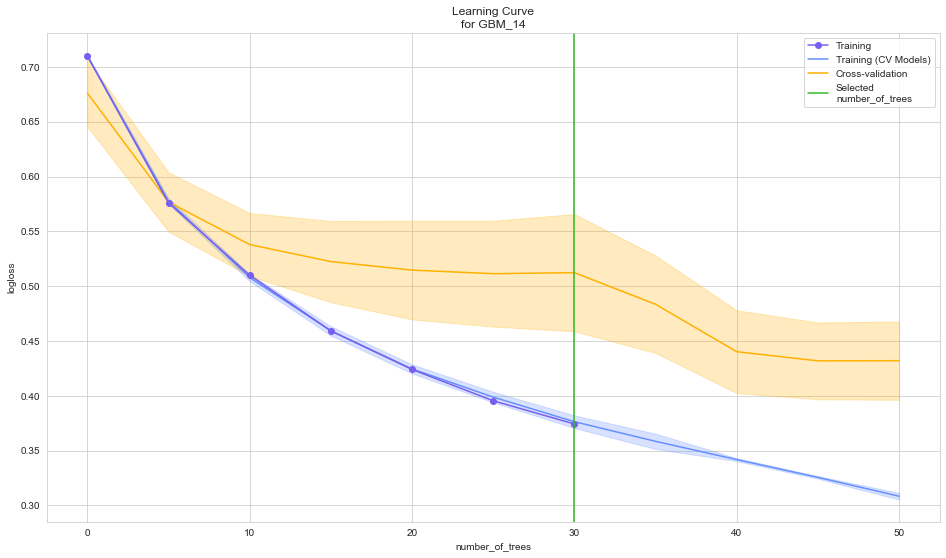

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

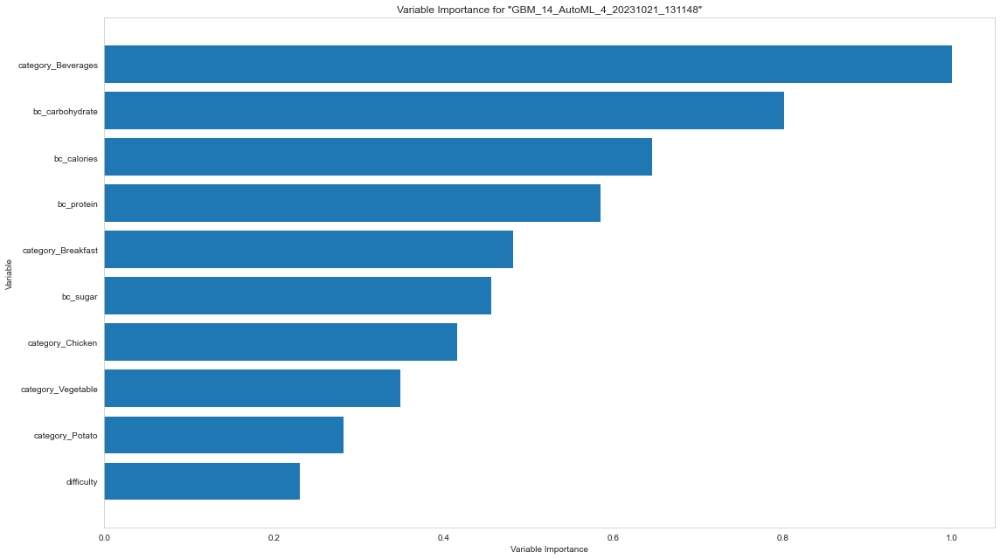

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

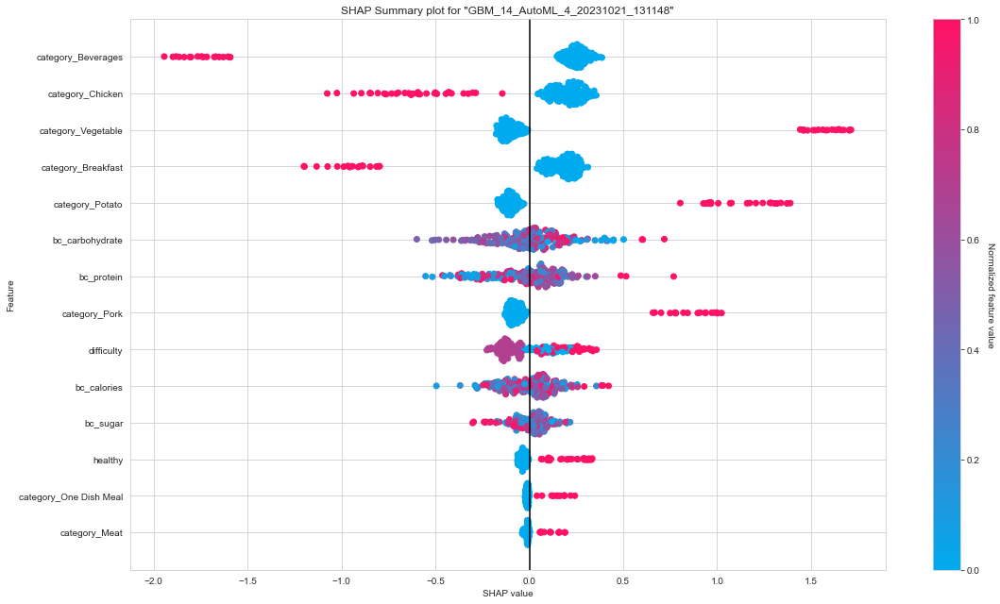

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

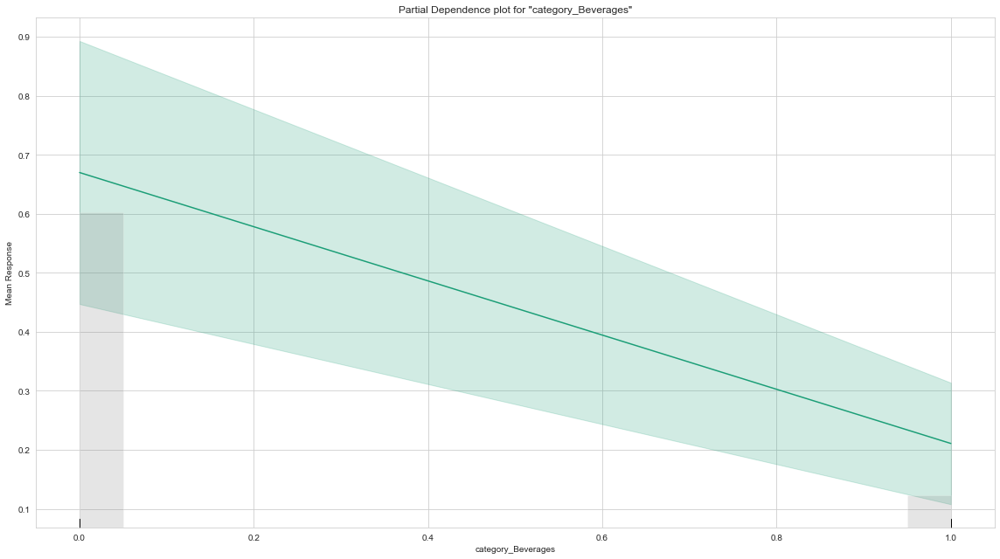

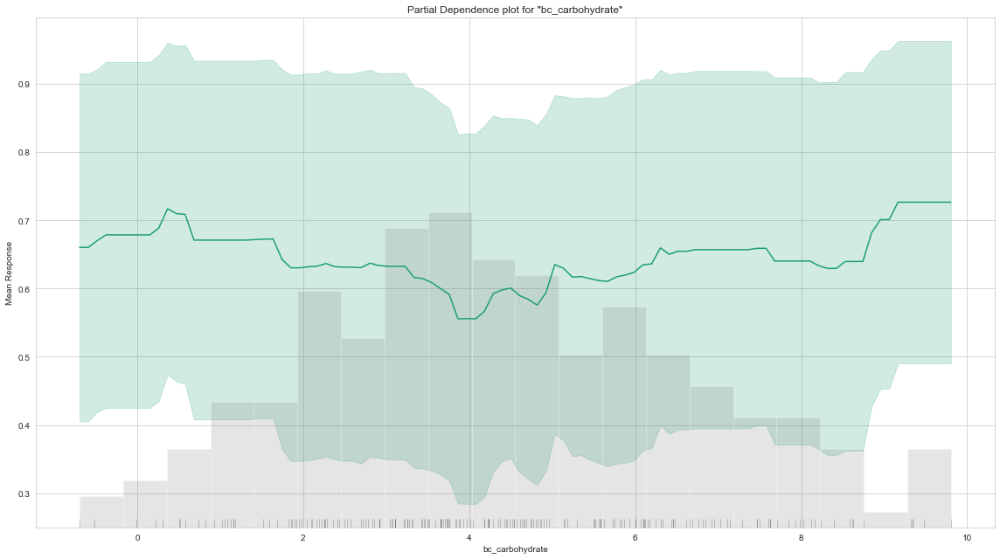

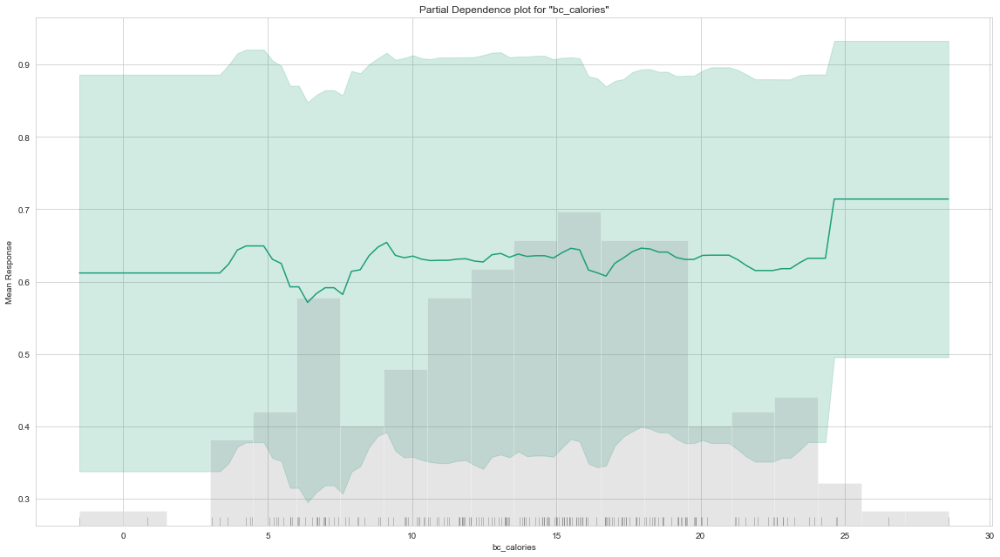

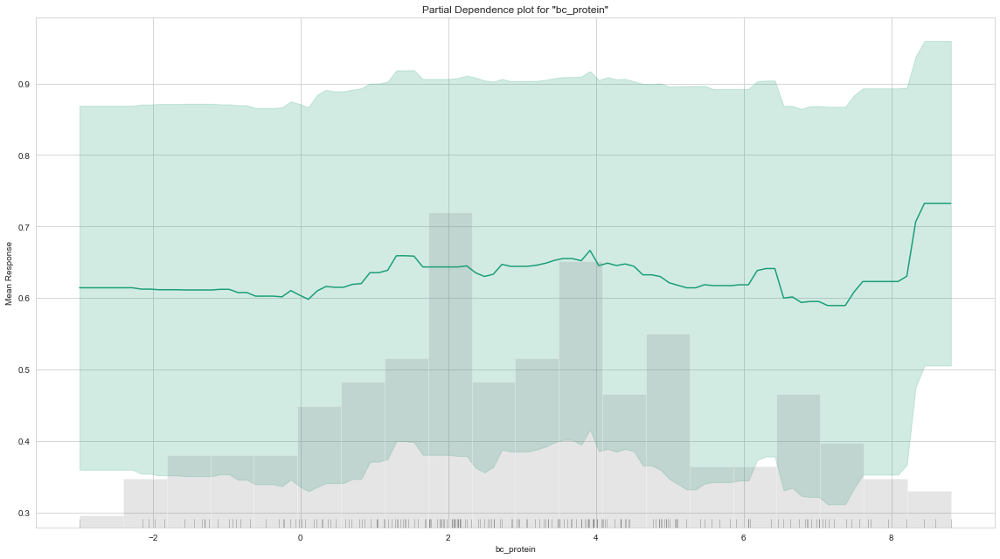

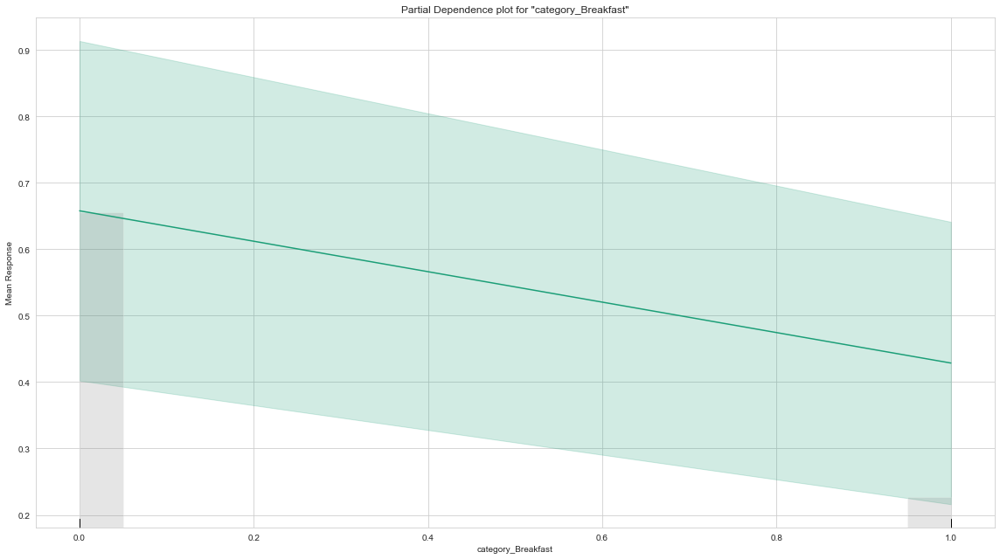

In [314]:
aml.leader.explain(test)


In [315]:
shap_values = aml.leader.predict_contributions(test)


contributions progress: |████████████████████████████████████████████████████████| (done) 100%


In [316]:
# Get model ids for all models in the AutoML Leaderboard
model_ids = list(aml.leaderboard['model_id'].as_data_frame().iloc[:, 0])

# Loop through each model in the leaderboard and display feature importance (if available)
for model_id in model_ids:
    model = h2o.get_model(model_id)
    
    # Check if the model has feature importance (e.g., GBM or DRF)
    if hasattr(model, 'varimp'):
        print(f"Feature Importance for Model: {model_id}")
        print(model.varimp())


Feature Importance for Model: GBM_14_AutoML_4_20231021_131148
[('category_Beverages', 111.19960021972656, 1.0, 0.17818792829885216), ('bc_carbohydrate', 89.22743225097656, 0.8024078510594125, 0.14297939263101064), ('bc_calories', 71.83650207519531, 0.646014031824295, 0.11511190198275988), ('bc_protein', 65.11985778808594, 0.5856123372693008, 0.10434904916426542), ('category_Breakfast', 53.67759323120117, 0.4827139047724642, 0.08601379065245479), ('bc_sugar', 50.79115676879883, 0.45675664902065527, 0.0813885210257165), ('category_Chicken', 46.24799728393555, 0.4159007513745652, 0.07410849326536978), ('category_Vegetable', 38.793678283691406, 0.3488652675642398, 0.06216357928269664), ('category_Potato', 31.379779815673828, 0.28219327905557634, 0.050283435774773025), ('difficulty', 25.626972198486328, 0.23045921161450506, 0.041065049474975426), ('category_Pork', 24.038551330566406, 0.21617479993693378, 0.038519739751181066), ('healthy', 7.8921589851379395, 0.07097290790203657, 0.012646515

By looking at the results, we can see that in fifteen minutes, and with less data, AutoML obtained scores somewhat close to what we obtained in the first tutorial. The AUC that we obtained was 0.828. Although this is a good AUC, because we have a very imbalanced dataset, we must also look at the misclassification errors for both classes. As you can see, our model is having a hard time classifying bad loans; this is mainly due because only about 3.6% of loans are labeled as bad loans. However, the model is doing very well when classifying good loans; although it is still far from being the best model, this gives us a solid starting point. Even though we set balance _lasses=True, we just tried a quick under-over sampling ratio. If we were to find the right value and gave AutoML more time, we could potentially improve the misclassification error for the bad_loan or predicted TRUE class

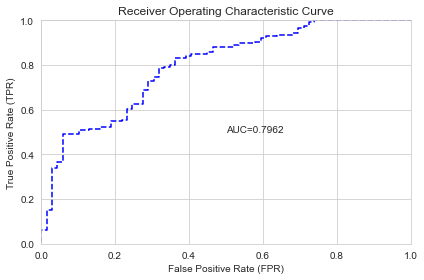

([0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.014492753623188406,
  0.014492753623188406,
  0.014492753623188406,
  0.014492753623188406,
  0.014492753623188406,
  0.014492753623188406,
  0.014492753623188406,
  0.014492753623188406,
  0.014492753623188406,
  0.014492753623188406,
  0.014492753623188406,
  0.014492753623188406,
  0.028985507246376812,
  0.028985507246376812,
  0.028985507246376812,
  0.028985507246376812,
  0.028985507246376812,
  0.028985507246376812,
  0.028985507246376812,
  0.028985507246376812,
  0.028985507246376812,
  0.028985507246376812,
  0.028985507246376812,
  0.028985507246376812,
  0.028985507246376812,
  0.028985507246376812,
  0.028985507246376812,
  0.028985507246376812,
  0.028985507246376812,
  0.028985507246376812,
  0.028985507246376812,
  0.028985507246376812,
  0.028985507246376812,
  0.028985507246376812,
  0.028985507246376812,
  0.028985507246376812,
  0.028985507246376812,
  0.043478260869565216,
  0.043478260869565216,
  0.0434

In [317]:
%matplotlib inline
aml.leader.model_performance(test_data=test).plot()

In [318]:
#use model to predict on test data
pred = model.predict(test)

#show predictions
pred

#show predictions as pandas dataframe
pred_df = pred.as_data_frame()
pred_df

drf prediction progress: |

███████████████████████████████████████████████████████| (done) 100%


,predict,p0,p1
0,1,0.367201,0.632799
1,0,0.385051,0.614949
2,1,0.163158,0.836842
3,1,0.268327,0.731673
4,1,0.186561,0.813439
...,...,...,...
190,1,0.283445,0.716555
191,0,0.406028,0.593972
192,1,0.141817,0.858183
193,1,0.152069,0.847931


In [319]:
#show predictions as pandas dataframe with actual values
pred_df = pred.as_data_frame()
pred_df['actual'] = test['high_traffic'].as_data_frame()
pred_df

,predict,p0,p1,actual
0,1,0.367201,0.632799,0
1,0,0.385051,0.614949,0
2,1,0.163158,0.836842,1
3,1,0.268327,0.731673,0
4,1,0.186561,0.813439,1
...,...,...,...,...
190,1,0.283445,0.716555,1
191,0,0.406028,0.593972,0
192,1,0.141817,0.858183,1
193,1,0.152069,0.847931,1


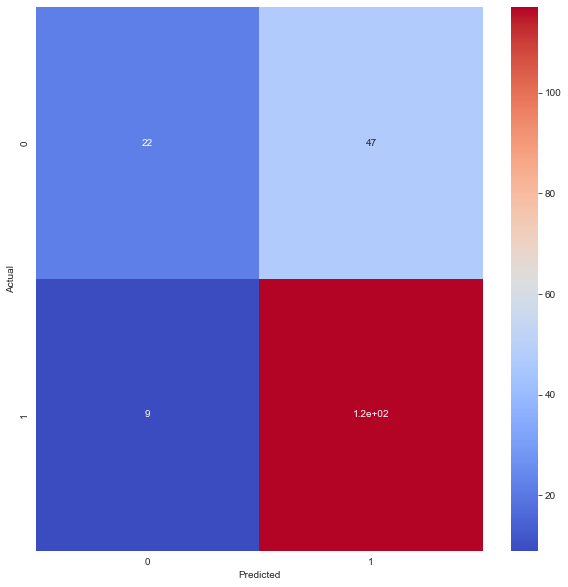

In [320]:
#plot confusion matrix
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(pred_df['actual'], pred_df['predict'])
plt.figure(figsize=(10,10))
sns.heatmap(cm, annot=True, cmap='coolwarm')
plt.xlabel('Predicted')
plt.ylabel('Actual')    
plt.show()

In [321]:
#show classification report
from sklearn.metrics import classification_report
print(classification_report(pred_df['actual'], pred_df['predict']))

              precision    recall  f1-score   support

           0       0.71      0.32      0.44        69
           1       0.71      0.93      0.81       126

    accuracy                           0.71       195
   macro avg       0.71      0.62      0.62       195
weighted avg       0.71      0.71      0.68       195



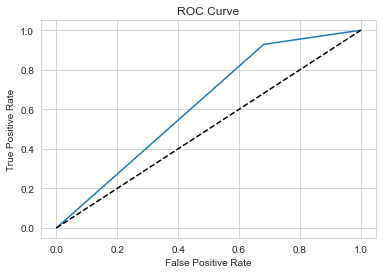

In [322]:
#show roc curve
from sklearn.metrics import roc_curve
fpr, tpr, thresholds = roc_curve(pred_df['actual'], pred_df['predict'])
plt.plot(fpr, tpr)
plt.plot([0,1], [0,1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.show()

In [323]:
#show auc score
from sklearn.metrics import roc_auc_score
roc_auc_score(pred_df['actual'], pred_df['predict'])

0.6237060041407867

In [324]:
#show accuracy score
from sklearn.metrics import accuracy_score
accuracy_score(pred_df['actual'], pred_df['predict'])

0.7128205128205128

In [325]:

#show precision score
from sklearn.metrics import precision_score
precision_score(pred_df['actual'], pred_df['predict'])

0.7134146341463414

In [326]:
#show recall score
from sklearn.metrics import recall_score
recall_score(pred_df['actual'], pred_df['predict'])

0.9285714285714286

In [327]:
#show f1 score
from sklearn.metrics import f1_score    
f1_score(pred_df['actual'], pred_df['predict'])

0.8068965517241379

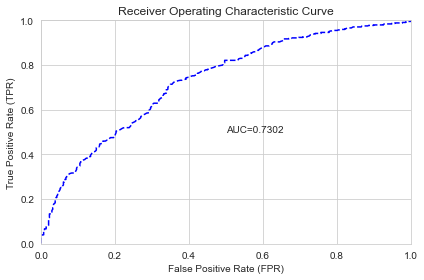

In [328]:
# Assuming you've already defined your model
perf = model.model_performance()

# Plot the AUC curve
perf.plot()

# Display the plot
import matplotlib.pyplot as plt
plt.show()


In [329]:
h2o.shutdown()

H2O session _sid_a587 closed.


/var/folders/ks/5bc1x9p158vgc4774v7r2tq40000gn/T/ipykernel_42011/2900054706.py:1: H2ODeprecationWarning: Deprecated, use ``h2o.cluster().shutdown()``.
  h2o.shutdown()
